# FEA and prediction trajectories

This notebook analyzes two related temporal questions:

1. **FEA trajectory characterization:** How do the recorded FEA signals evolve across the 30 chronological observations, both at category-average and individual-reenactment level?
2. **FEA × prediction trajectory synthesis:** How do those signal trajectories relate descriptively to the evolution of the frozen FEA sequence model's predictions?

The notebook explicitly includes **individual-sample analyses** because category-average trajectories can look smooth even when individual reenactments contain much faster transitions occurring at heterogeneous sequence positions.

## Main research questions

### FEA trajectories

- How do category-associated FEA patterns evolve across the 30 observations?
- Do individual reenactments show sharper transitions than the category-average curves suggest?
- At which sequence positions do the strongest within-reenactment FEA changes occur, and how heterogeneous are those positions?
- Do temporal trajectories reveal distinctions that sequence-level aggregation can obscure?
- Are the main category-level trajectory patterns robust to participant balancing?

### FEA × prediction trajectories

- How do true-class and eventual-final-class probabilities evolve as progressively more observations become available?
- Are individual probability transitions substantially sharper than the smooth category-average probability curves?
- Once the eventual final class reaches high probability, does that confidence usually remain high?
- Do strong FEA changes occur near the rapid probability transitions of the model?
- How do these joint trajectories differ between finally correct and finally incorrect reenactments?
- For recurrent confusion pairs such as Anger–Disgust and Fear–Surprise, do competing class probabilities and FEA trajectories show corresponding ambiguity?

## Interpretation boundaries

The raw FEA analyses characterize the recorded Meta coefficients; they do not validate them as FACS Action Unit measurements.

The prediction trajectories are **prefix probes of the frozen trained FEA sequence model**. For timestep `t`, the model receives only observations `1 ... t`; the model is not retrained for each prefix length. Temporal coincidence between an FEA change and a probability change is therefore descriptive and does not establish causal feature importance.

The 30 observations are treated as chronological sequence positions. Terms such as *onset*, *apex*, and *offset* are not used because those phases were not annotated.


## 1. Imports and paths

Run this notebook from:

`emohevrdb-dfer/6_discussion/fea_analysis/`

The canonical DFEA files and FACS–FEA mapping are expected in `data/`. The existing `fea_prediction_trajectories.csv` is read from the FEA sequence-order-ablation trajectory directory and is **not recomputed** here.


In [1]:
from pathlib import Path
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, Markdown

pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 180)
pd.set_option("display.float_format", lambda x: f"{x:.4f}")

ANALYSIS_DIR = Path.cwd()
REPO_DIR = ANALYSIS_DIR.parent.parent
DATA_DIR = ANALYSIS_DIR / "data"
OUTPUT_DIR = ANALYSIS_DIR / "outputs" / "07_fea_and_prediction_trajectories"
FIGURE_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tables"

FIGURE_DIR.mkdir(parents=True, exist_ok=True)
TABLE_DIR.mkdir(parents=True, exist_ok=True)

MAPPING_PATH = DATA_DIR / "facs_fea_mapping.json"
PREDICTION_TRAJECTORIES_PATH = (
    REPO_DIR
    / "5_dynamic_facial_expression_recognition"
    / "5_2_fea_sequence_based_fer"
    / "5_2_4_sequence_order_ablation"
    / "trajectories"
    / "fea_prediction_trajectories.csv"
)

print("Data directory:", DATA_DIR.resolve())
print("Mapping:", MAPPING_PATH.resolve())
print("Prediction trajectories:", PREDICTION_TRAJECTORIES_PATH.resolve())
print("Output directory:", OUTPUT_DIR.resolve())


Data directory: /workspace/repos/emohevrdb-dfer/6_discussion/fea_analysis/data
Mapping: /workspace/repos/emohevrdb-dfer/6_discussion/fea_analysis/data/facs_fea_mapping.json
Prediction trajectories: /workspace/repos/emohevrdb-dfer/5_dynamic_facial_expression_recognition/5_2_fea_sequence_based_fer/5_2_4_sequence_order_ablation/trajectories/fea_prediction_trajectories.csv
Output directory: /workspace/repos/emohevrdb-dfer/6_discussion/fea_analysis/outputs/07_fea_and_prediction_trajectories


## 2. Schema and constants


In [2]:
CATEGORY_ORDER = ["Anger", "Disgust", "Fear", "Happiness", "Neutral", "Sadness", "Surprise"]
SPLITS = ["train", "validation", "test"]
TIMESTEPS = list(range(1, 31))
EVENT_WINDOW = 5

META_COLUMNS = [
    "reenactment_id", "split", "sequence_timestamp", "set_id", "participant_id",
    "level_id", "emoji_id", "timestep", "observation_timestamp",
    "is_reference_observation", "true_label_id", "true_label",
]

FEA_COLUMNS = [
    "BrowLowererL", "BrowLowererR", "CheekPuffL", "CheekPuffR", "CheekRaiserL",
    "CheekRaiserR", "CheekSuckL", "CheekSuckR", "ChinRaiserB", "ChinRaiserT",
    "DimplerL", "DimplerR", "EyesClosedL", "EyesClosedR", "EyesLookDownL",
    "EyesLookDownR", "EyesLookLeftL", "EyesLookLeftR", "EyesLookRightL",
    "EyesLookRightR", "EyesLookUpL", "EyesLookUpR", "InnerBrowRaiserL",
    "InnerBrowRaiserR", "JawDrop", "JawSidewaysLeft", "JawSidewaysRight",
    "JawThrust", "LidTightenerL", "LidTightenerR", "LipCornerDepressorL",
    "LipCornerDepressorR", "LipCornerPullerL", "LipCornerPullerR", "LipFunnelerLB",
    "LipFunnelerLT", "LipFunnelerRB", "LipFunnelerRT", "LipPressorL", "LipPressorR",
    "LipPuckerL", "LipPuckerR", "LipStretcherL", "LipStretcherR", "LipSuckLB",
    "LipSuckLT", "LipSuckRB", "LipSuckRT", "LipTightenerL", "LipTightenerR",
    "LipsToward", "LowerLipDepressorL", "LowerLipDepressorR", "MouthLeft",
    "MouthRight", "NoseWrinklerL", "NoseWrinklerR", "OuterBrowRaiserL",
    "OuterBrowRaiserR", "UpperLidRaiserL", "UpperLidRaiserR", "UpperLipRaiserL",
    "UpperLipRaiserR",
]

PROBABILITY_COLUMNS = [f"probability_{category.lower()}" for category in CATEGORY_ORDER]

assert len(FEA_COLUMNS) == 63
assert len(FEA_COLUMNS) == len(set(FEA_COLUMNS))


## 3. Load and validate canonical DFEA data, mapping, and prediction trajectories


In [3]:
dfea = {split: pd.read_csv(DATA_DIR / f"dfea_{split}.csv") for split in SPLITS}

for split, df in dfea.items():
    assert df.columns.tolist() == META_COLUMNS + FEA_COLUMNS
    assert df["split"].eq(split).all()
    assert not df.duplicated(["reenactment_id", "timestep"]).any()
    assert df.groupby("reenactment_id").size().eq(30).all()
    assert df.groupby("reenactment_id")["timestep"].nunique().eq(30).all()
    assert df[FEA_COLUMNS].notna().all().all()

all_dfea = pd.concat([dfea[split] for split in SPLITS], ignore_index=True)
dfea_test = dfea["test"].copy()

mapping = json.loads(MAPPING_PATH.read_text(encoding="utf-8"))
mapping_df = pd.DataFrame(mapping["fea_to_facs"])
paper_au_rows = pd.DataFrame(mapping["paper_table"]["au_to_fea"])

assert set(mapping_df["fea_name"]) == set(FEA_COLUMNS)
assert mapping_df["fea_name"].is_unique
assert mapping["interpretation"]["official_meta_to_facs_mapping"] is False
assert mapping["interpretation"]["validated_au_measurement"] is False

prediction_trajectories = pd.read_csv(PREDICTION_TRAJECTORIES_PATH)

required_trajectory_columns = [
    "sample_id", "sequence_id", "sequence_timestamp", "set_id", "participant_id",
    "level_id", "emoji_id", "timestep", "observation_timestamp", "true_class_id",
    "true_class", "predicted_class_id", "predicted_class", "true_class_probability",
    "predicted_class_probability", "correct_at_timestep", "correct_final_prediction",
] + PROBABILITY_COLUMNS

missing = [column for column in required_trajectory_columns if column not in prediction_trajectories.columns]
assert not missing, f"Missing trajectory columns: {missing}"
assert len(prediction_trajectories) == 378 * 30
assert prediction_trajectories["sample_id"].is_unique
assert prediction_trajectories["sequence_id"].nunique() == 378
assert prediction_trajectories.groupby("sequence_id").size().eq(30).all()
assert prediction_trajectories.groupby("sequence_id")["timestep"].nunique().eq(30).all()
assert np.allclose(prediction_trajectories[PROBABILITY_COLUMNS].sum(axis=1), 1.0, atol=1e-5)

# The canonical reenactment_id and the trajectory sequence_id identify the same test sequences.
assert set(dfea_test["reenactment_id"]) == set(prediction_trajectories["sequence_id"])

trajectory_metadata = prediction_trajectories[
    ["sequence_id", "timestep", "observation_timestamp", "participant_id", "level_id", "emoji_id", "true_class"]
].rename(columns={"sequence_id": "reenactment_id", "true_class": "true_label"})

validation_join = dfea_test[
    ["reenactment_id", "timestep", "observation_timestamp", "participant_id", "level_id", "emoji_id", "true_label"]
].merge(
    trajectory_metadata,
    on=["reenactment_id", "timestep"],
    how="outer",
    validate="one_to_one",
    suffixes=("_dfea", "_trajectory"),
    indicator=True,
)

assert validation_join["_merge"].eq("both").all()
for column in ["observation_timestamp", "participant_id", "level_id", "emoji_id", "true_label"]:
    assert validation_join[f"{column}_dfea"].eq(validation_join[f"{column}_trajectory"]).all()

final_rows = prediction_trajectories.loc[prediction_trajectories["timestep"].eq(30)]
assert len(final_rows) == 378
assert final_rows["correct_at_timestep"].sum() == 296

print(
    f"DFEA: {len(all_dfea):,} observations, "
    f"{all_dfea['reenactment_id'].nunique():,} reenactments, "
    f"{all_dfea['participant_id'].nunique()} participants."
)
print(
    f"Prediction trajectories: {len(prediction_trajectories):,} prefix probes, "
    f"{prediction_trajectories['sequence_id'].nunique()} test reenactments."
)
print("Mapping version:", mapping["mapping_version"])


DFEA: 51,810 observations, 1,727 reenactments, 36 participants.
Prediction trajectories: 11,340 prefix probes, 378 test reenactments.
Mapping version: 1.2.1


## 4. Manuscript-relevant FEA channels and semantic AU groups

The focused trajectory analyses retain the **individual FEA channels** corresponding to the manuscript-relevant AUs rather than hiding left/right or multi-component differences through averaging.

Semantic AU groups are also constructed as the mean of their member FEA coefficients for compact trajectory views. These groups remain a semantic crosswalk only; they are not validated AU intensity measurements.


In [4]:
mapped_paper_aus = (
    paper_au_rows.loc[paper_au_rows["fea_count"].gt(0)]
    .sort_values("au_number")
    .reset_index(drop=True)
)

paper_au_fea_pairs = []
paper_au_groups = {}

for _, row in mapped_paper_aus.iterrows():
    fea_names = [name.strip() for name in row["fea_names"].split("|") if name.strip()]
    paper_au_groups[row["au_code"]] = fea_names

    for fea_name in fea_names:
        paper_au_fea_pairs.append(
            {
                "au_code": row["au_code"],
                "au_name": row["au_name"],
                "fea_name": fea_name,
                "paper_expression_categories": row["paper_expression_categories"],
            }
        )

paper_au_fea_pairs = pd.DataFrame(paper_au_fea_pairs)
PAPER_AU_FEA_COLUMNS = paper_au_fea_pairs["fea_name"].tolist()
PAPER_AU_IDS = list(paper_au_groups)

assert len(PAPER_AU_IDS) == 17
assert len(PAPER_AU_FEA_COLUMNS) == 35
assert len(PAPER_AU_FEA_COLUMNS) == len(set(PAPER_AU_FEA_COLUMNS))


def add_paper_au_groups(frame):
    result = frame.copy()
    for au_code, members in paper_au_groups.items():
        result[au_code] = result[members].mean(axis=1)
    return result


all_dfea_groups = add_paper_au_groups(all_dfea)
dfea_test_groups = add_paper_au_groups(dfea_test)

paper_au_fea_pairs.to_csv(TABLE_DIR / "paper_relevant_au_fea_channels.csv", index=False)
mapped_paper_aus.to_csv(TABLE_DIR / "paper_relevant_au_groups.csv", index=False)

display(paper_au_fea_pairs.head(12))


,au_code,au_name,fea_name,paper_expression_categories
0,AU1,Inner Brow Raiser,InnerBrowRaiserL,Fear | Sadness | Surprise
1,AU1,Inner Brow Raiser,InnerBrowRaiserR,Fear | Sadness | Surprise
2,AU2,Outer Brow Raiser,OuterBrowRaiserL,Fear | Surprise
3,AU2,Outer Brow Raiser,OuterBrowRaiserR,Fear | Surprise
4,AU4,Brow Lowerer,BrowLowererL,Anger | Fear | Sadness
5,AU4,Brow Lowerer,BrowLowererR,Anger | Fear | Sadness
6,AU5,Upper Lid Raiser,UpperLidRaiserL,Anger | Fear | Surprise
7,AU5,Upper Lid Raiser,UpperLidRaiserR,Anger | Fear | Surprise
8,AU6,Cheek Raiser,CheekRaiserL,Happiness | Sadness
9,AU6,Cheek Raiser,CheekRaiserR,Happiness | Sadness


# Part I — FEA trajectory characterization

The primary dataset-level view uses **all train, validation, and test reenactments** because the goal is to characterize the recorded FEA signals rather than evaluate a model.

The primary representation is the **raw Meta coefficient scale**. Sample-weighted category means are shown first, with participant-balanced means used as a robustness check.


## 5. Category-level raw trajectories for all 63 FEAs

The exported table contains the mean raw coefficient for every Category × Timestep × FEA combination.

For visual inspection, one heatmap per category shows all 63 FEA channels over the 30 chronological observations. A common color scale is used across categories.


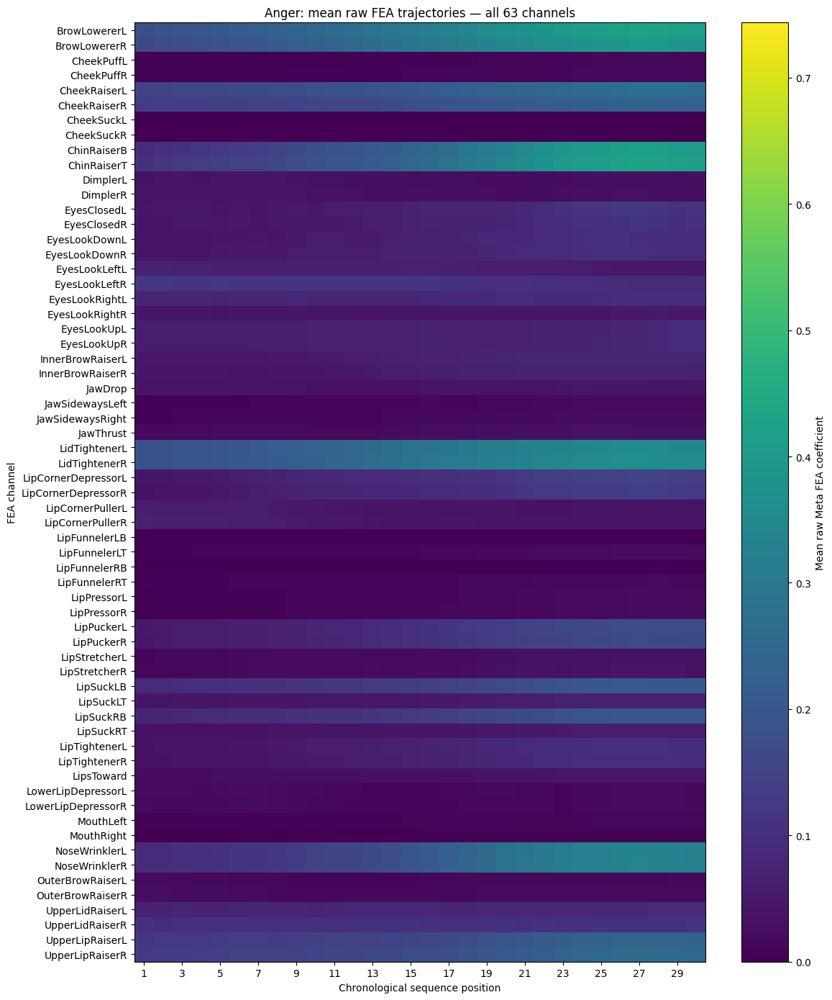

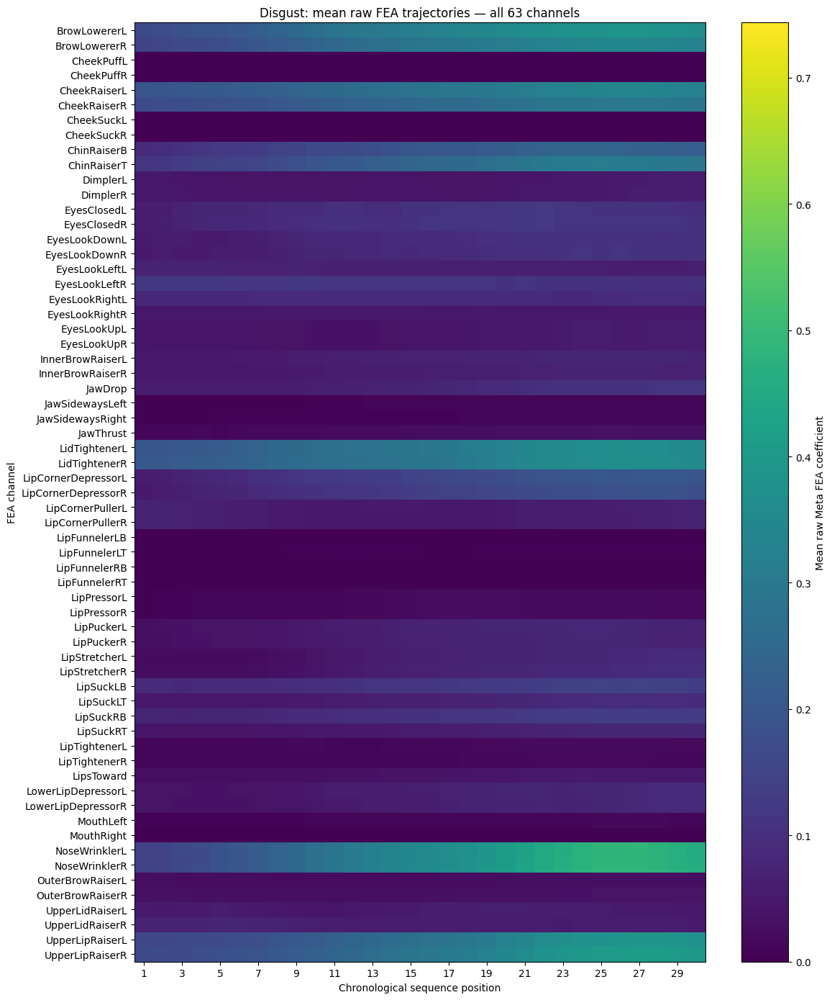

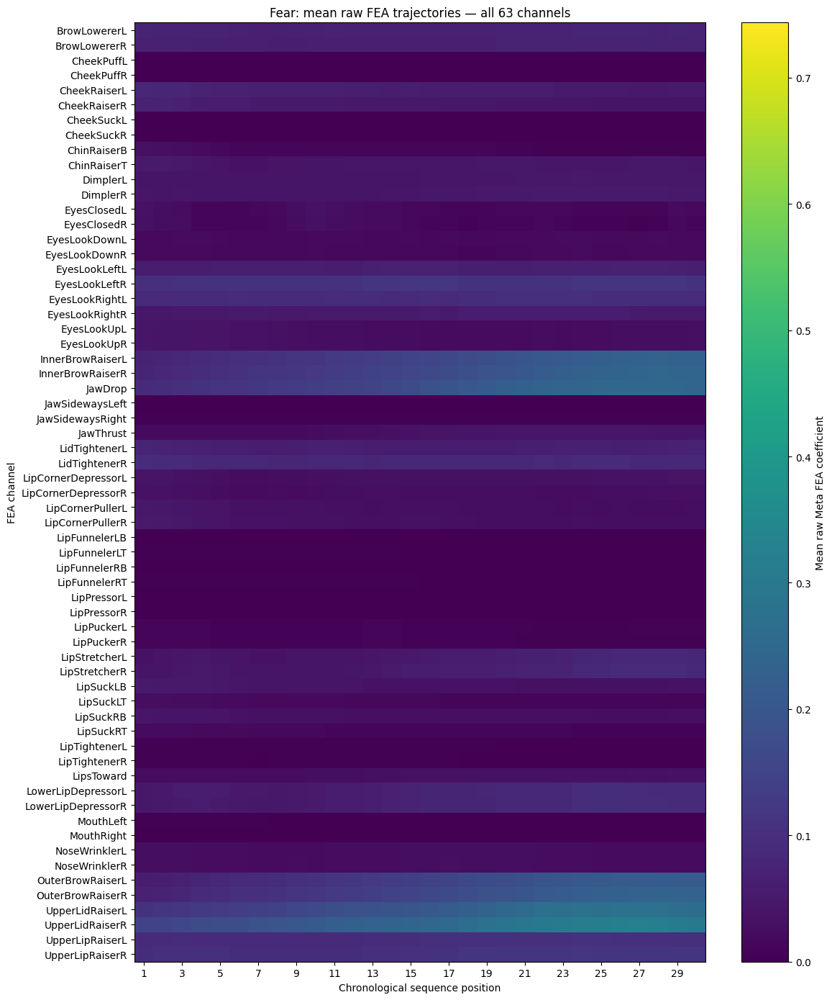

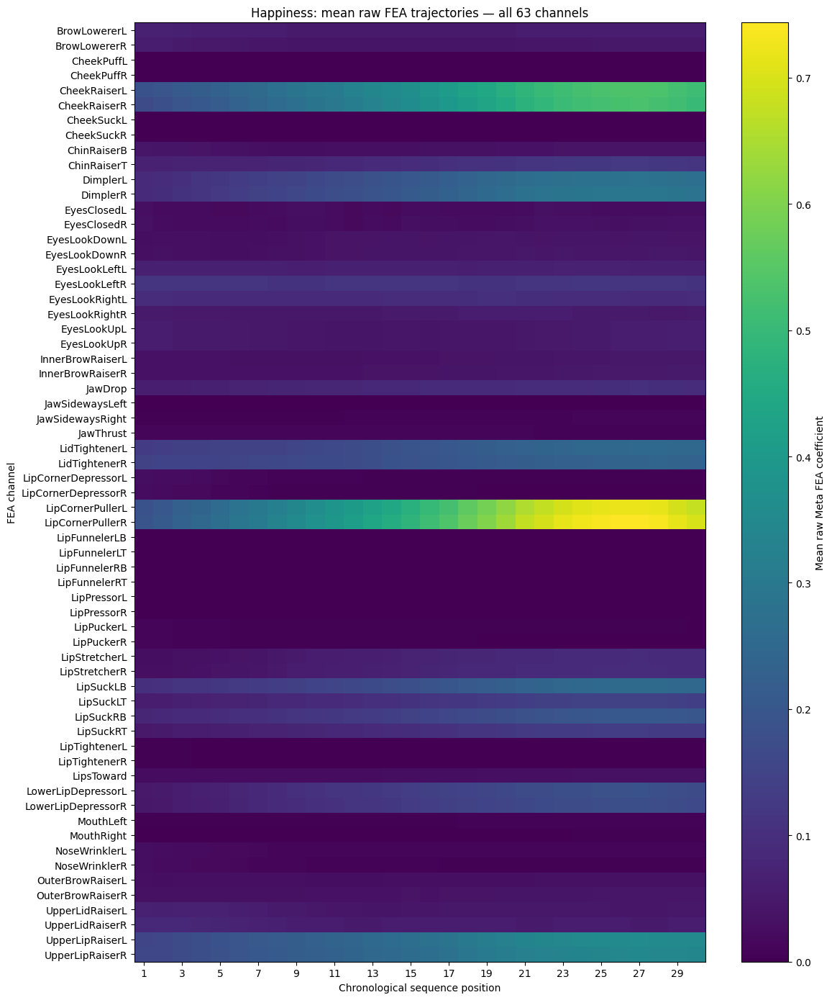

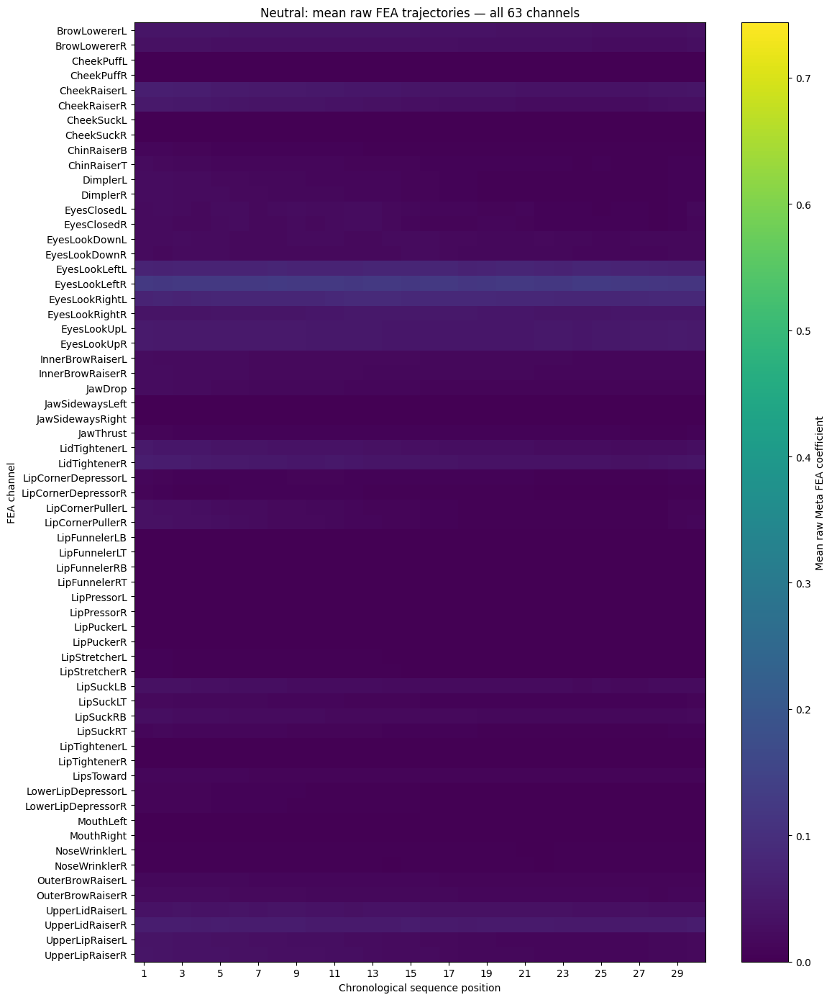

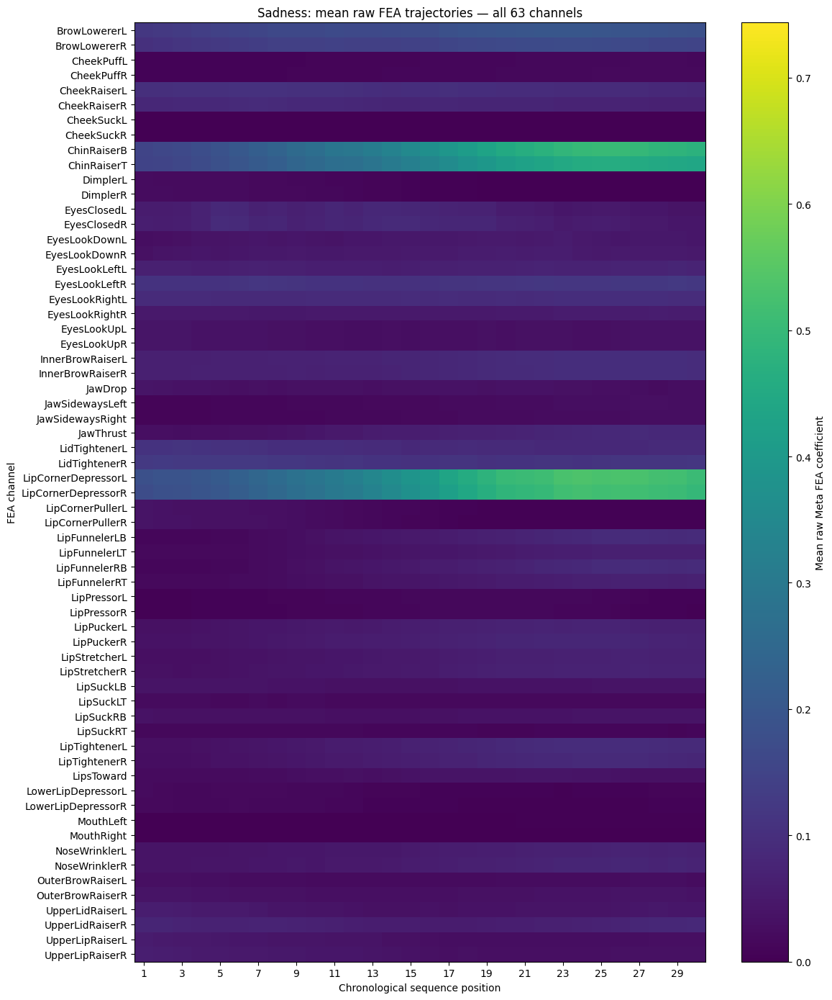

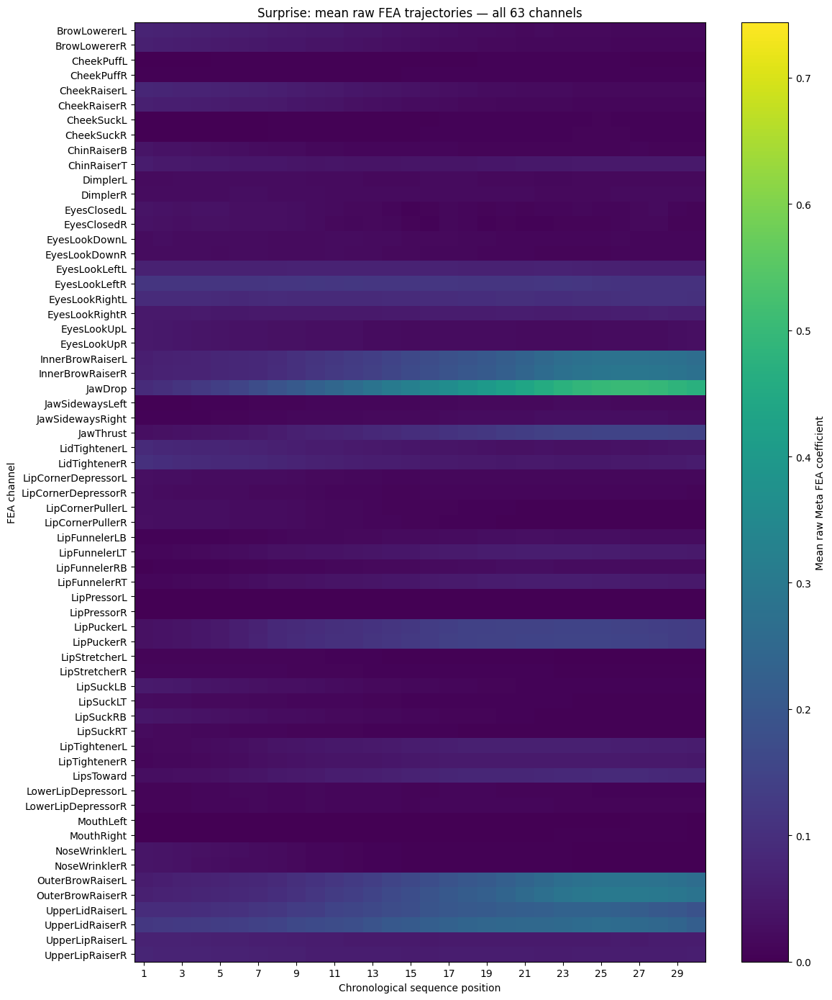

In [5]:
category_fea_trajectory = (
    all_dfea.groupby(["true_label", "timestep"], observed=True)[FEA_COLUMNS]
    .mean()
    .reindex(pd.MultiIndex.from_product([CATEGORY_ORDER, TIMESTEPS], names=["true_label", "timestep"]))
)

category_fea_trajectory_long = (
    category_fea_trajectory.reset_index()
    .melt(id_vars=["true_label", "timestep"], var_name="fea_name", value_name="raw_mean")
)

category_fea_trajectory_long.to_csv(
    TABLE_DIR / "all_63_fea_category_trajectories_raw.csv", index=False
)

global_fea_vmax = float(category_fea_trajectory.to_numpy().max())

for category in CATEGORY_ORDER:
    matrix = category_fea_trajectory.loc[category].T

    fig, ax = plt.subplots(figsize=(12, 14))
    image = ax.imshow(matrix.to_numpy(), aspect="auto", vmin=0, vmax=global_fea_vmax)
    ax.set_xticks(np.arange(0, 30, 2), np.arange(1, 31, 2))
    ax.set_yticks(np.arange(len(FEA_COLUMNS)), FEA_COLUMNS)
    ax.set_xlabel("Chronological sequence position")
    ax.set_ylabel("FEA channel")
    ax.set_title(f"{category}: mean raw FEA trajectories — all 63 channels")
    fig.colorbar(image, ax=ax, label="Mean raw Meta FEA coefficient")
    fig.tight_layout()
    fig.savefig(FIGURE_DIR / f"all_63_fea_trajectories_{category.lower()}.png", dpi=180)
    plt.show()


## 6. Focused trajectories for manuscript-relevant FEAs and AU-related groups


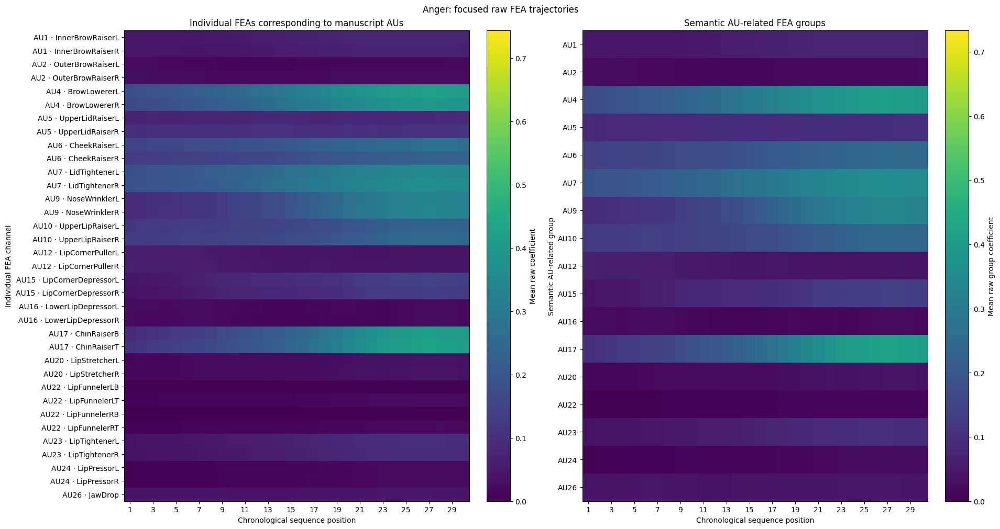

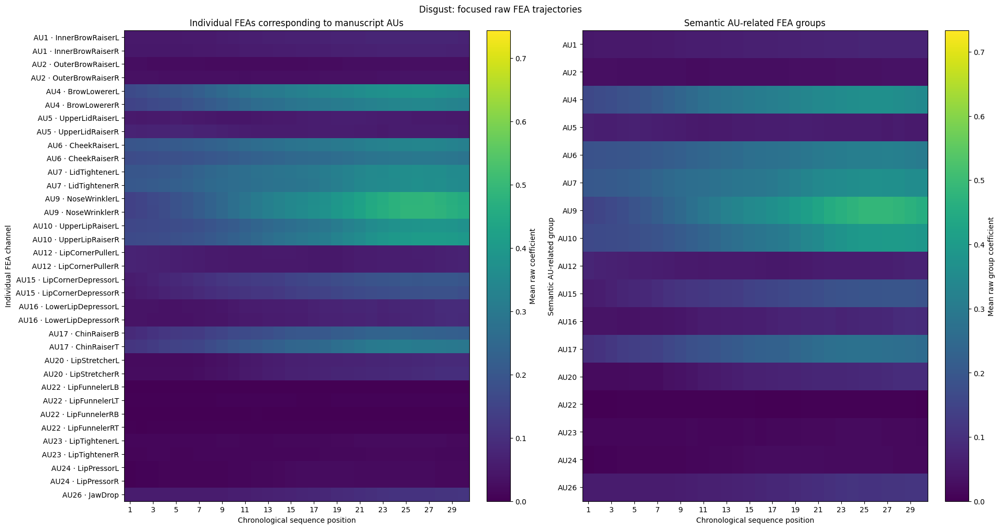

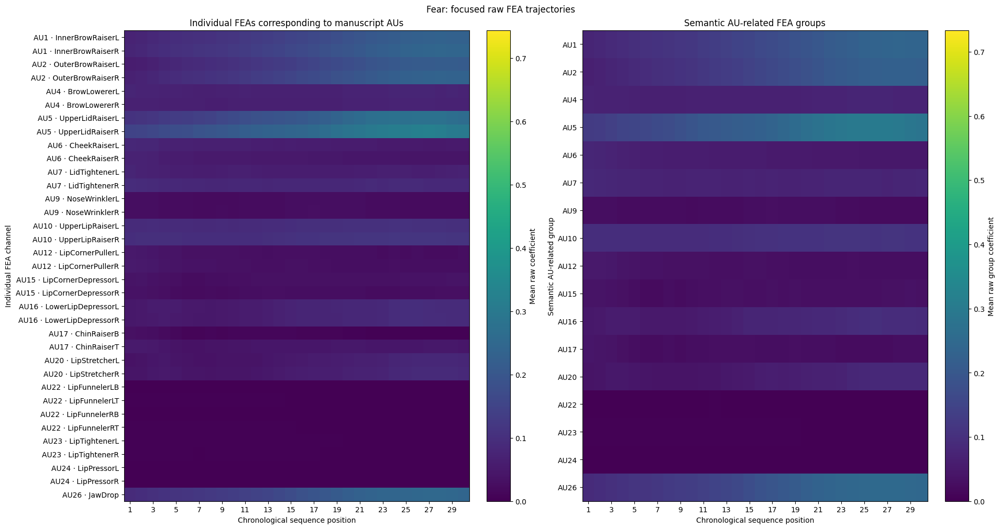

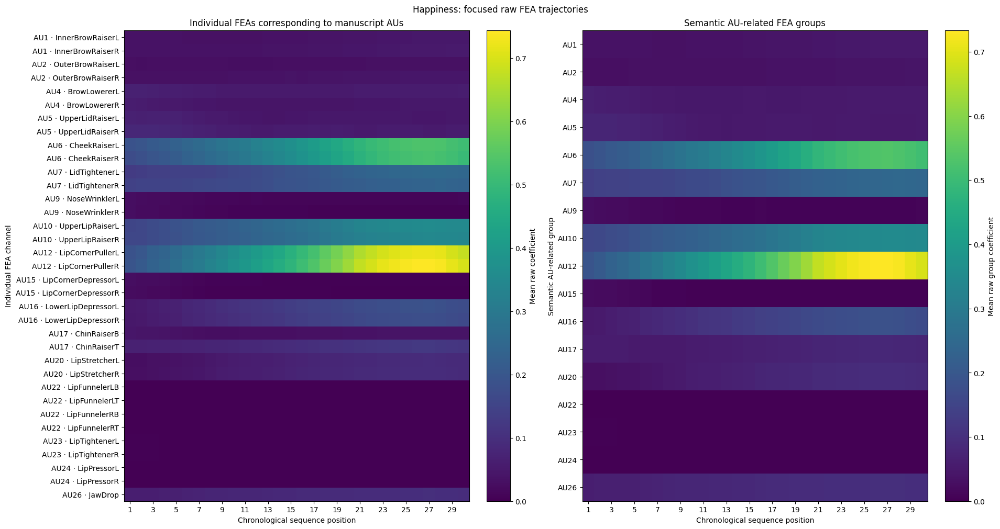

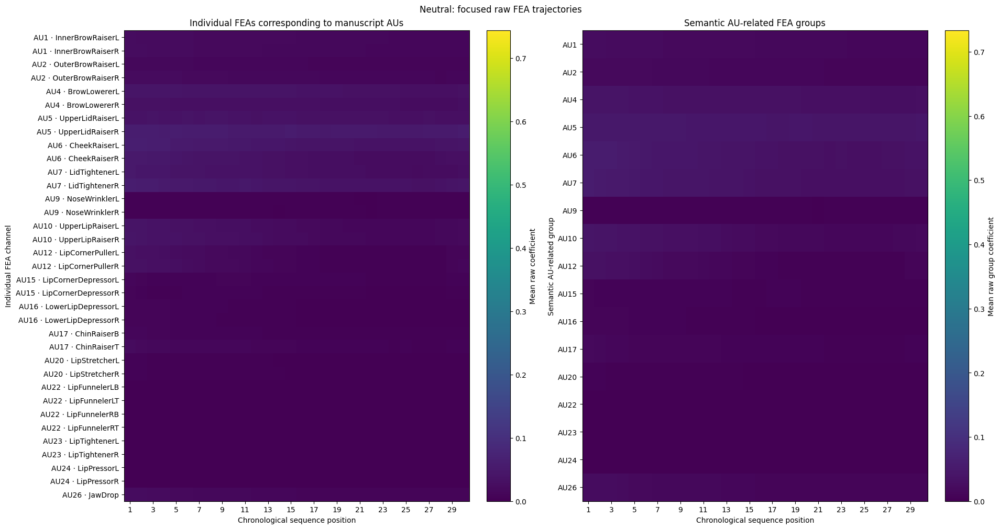

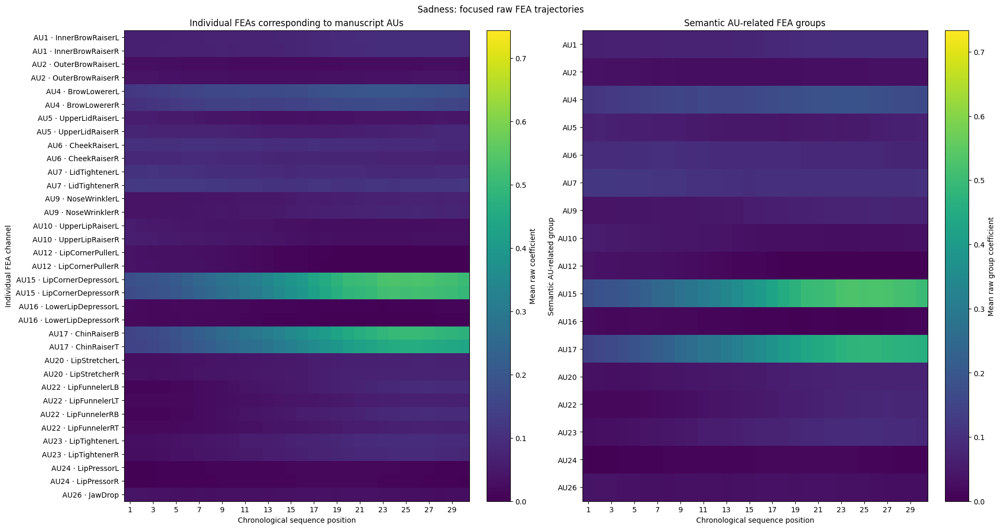

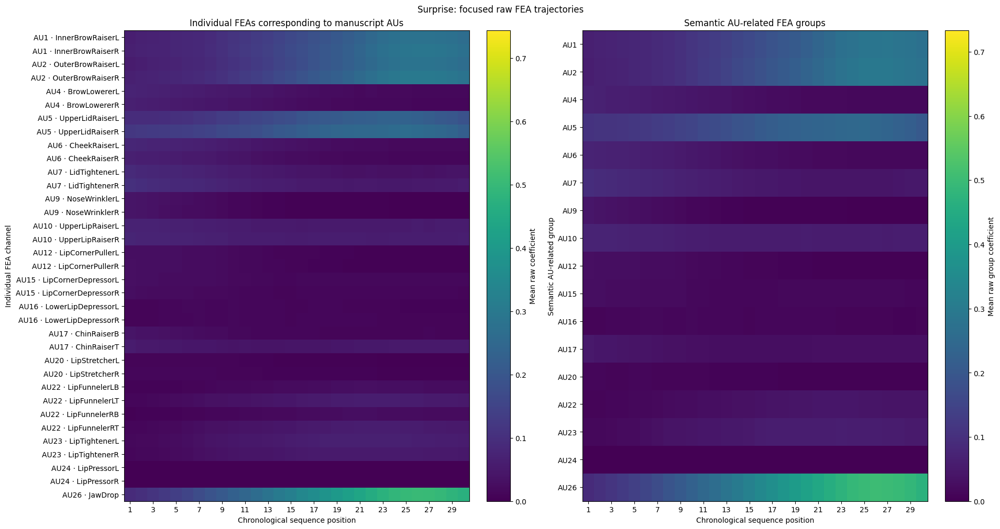

In [6]:
focused_fea_trajectory = category_fea_trajectory[PAPER_AU_FEA_COLUMNS].copy()

group_trajectory = (
    all_dfea_groups.groupby(["true_label", "timestep"], observed=True)[PAPER_AU_IDS]
    .mean()
    .reindex(pd.MultiIndex.from_product([CATEGORY_ORDER, TIMESTEPS], names=["true_label", "timestep"]))
)

focused_fea_trajectory.reset_index().melt(
    id_vars=["true_label", "timestep"], var_name="fea_name", value_name="raw_mean"
).to_csv(TABLE_DIR / "paper_relevant_fea_category_trajectories_raw.csv", index=False)

group_trajectory.reset_index().melt(
    id_vars=["true_label", "timestep"], var_name="au_code", value_name="raw_mean"
).to_csv(TABLE_DIR / "paper_au_group_category_trajectories_raw.csv", index=False)

focused_vmax = float(focused_fea_trajectory.to_numpy().max())
group_vmax = float(group_trajectory.to_numpy().max())

fea_label_lookup = paper_au_fea_pairs.set_index("fea_name")
focused_labels = [
    f"{fea_label_lookup.loc[fea, 'au_code']} · {fea}"
    for fea in PAPER_AU_FEA_COLUMNS
]

for category in CATEGORY_ORDER:
    fea_matrix = focused_fea_trajectory.loc[category].T
    group_matrix = group_trajectory.loc[category].T

    fig, axes = plt.subplots(1, 2, figsize=(19, 10), layout="constrained")

    image_1 = axes[0].imshow(fea_matrix.to_numpy(), aspect="auto", vmin=0, vmax=focused_vmax)
    axes[0].set_xticks(np.arange(0, 30, 2), np.arange(1, 31, 2))
    axes[0].set_yticks(np.arange(len(focused_labels)), focused_labels)
    axes[0].set_xlabel("Chronological sequence position")
    axes[0].set_ylabel("Individual FEA channel")
    axes[0].set_title("Individual FEAs corresponding to manuscript AUs")
    fig.colorbar(image_1, ax=axes[0], label="Mean raw coefficient")

    image_2 = axes[1].imshow(group_matrix.to_numpy(), aspect="auto", vmin=0, vmax=group_vmax)
    axes[1].set_xticks(np.arange(0, 30, 2), np.arange(1, 31, 2))
    axes[1].set_yticks(np.arange(len(PAPER_AU_IDS)), PAPER_AU_IDS)
    axes[1].set_xlabel("Chronological sequence position")
    axes[1].set_ylabel("Semantic AU-related group")
    axes[1].set_title("Semantic AU-related FEA groups")
    fig.colorbar(image_2, ax=axes[1], label="Mean raw group coefficient")

    fig.suptitle(f"{category}: focused raw FEA trajectories")
    fig.savefig(FIGURE_DIR / f"focused_fea_trajectories_{category.lower()}.png", dpi=180)
    plt.show()


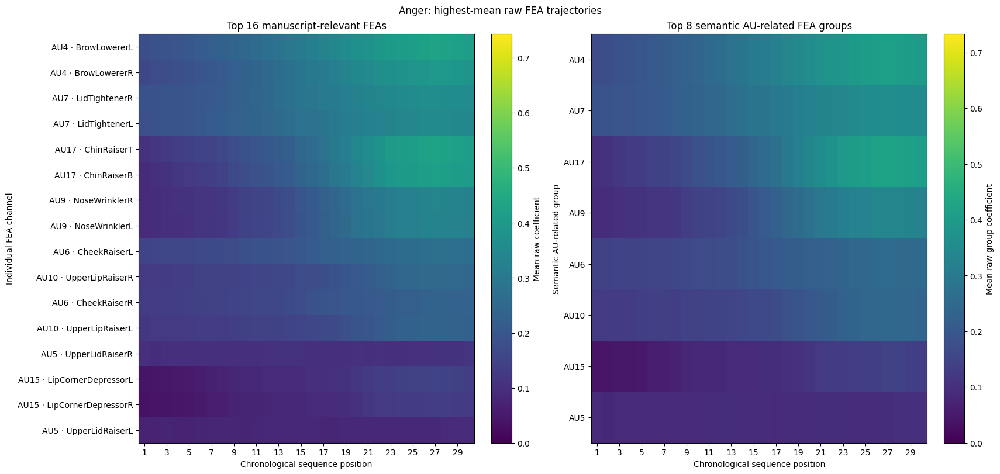

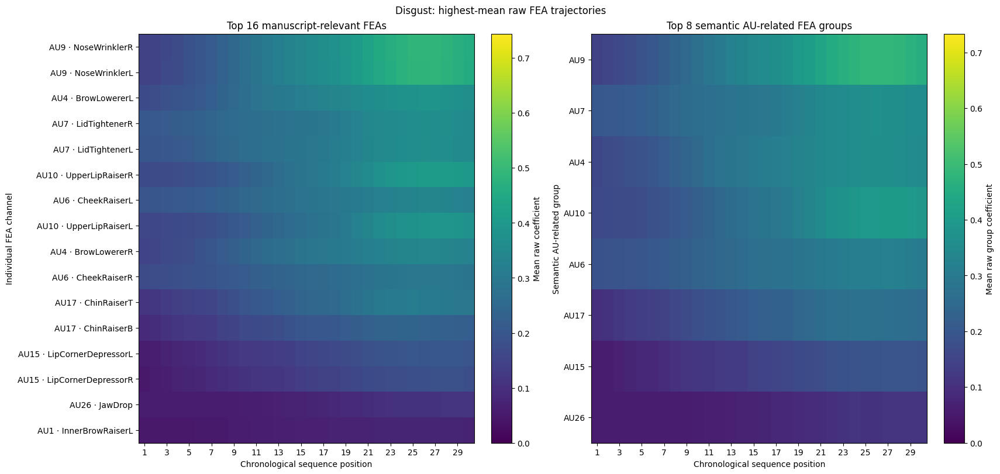

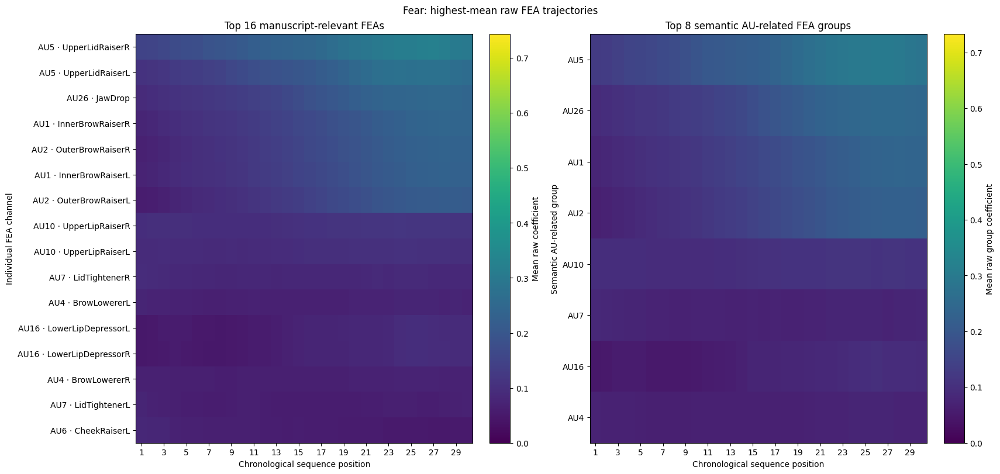

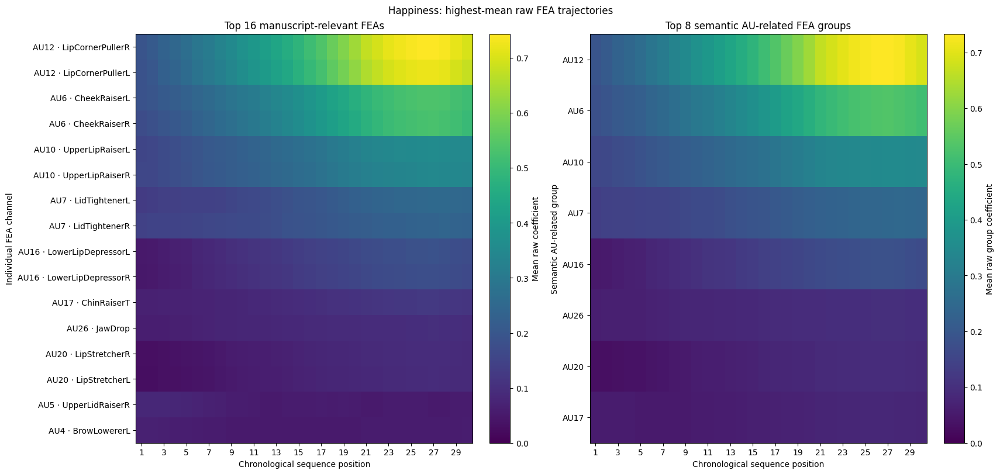

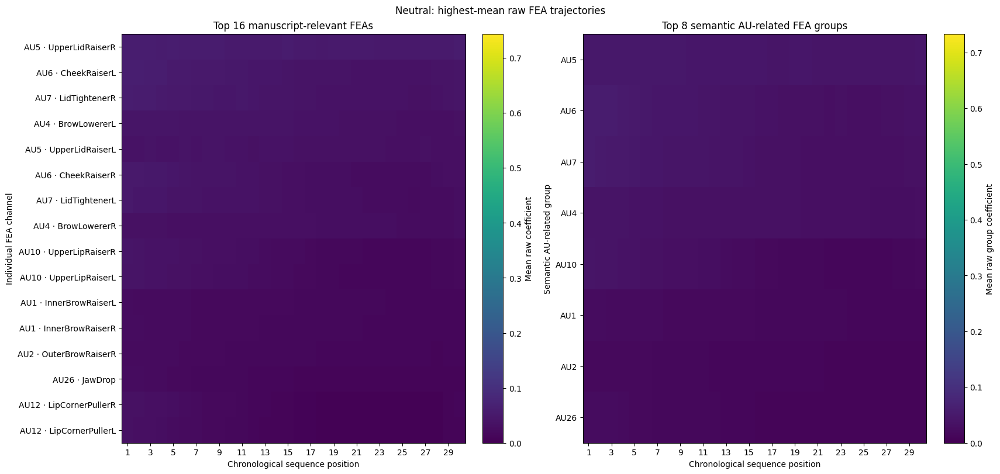

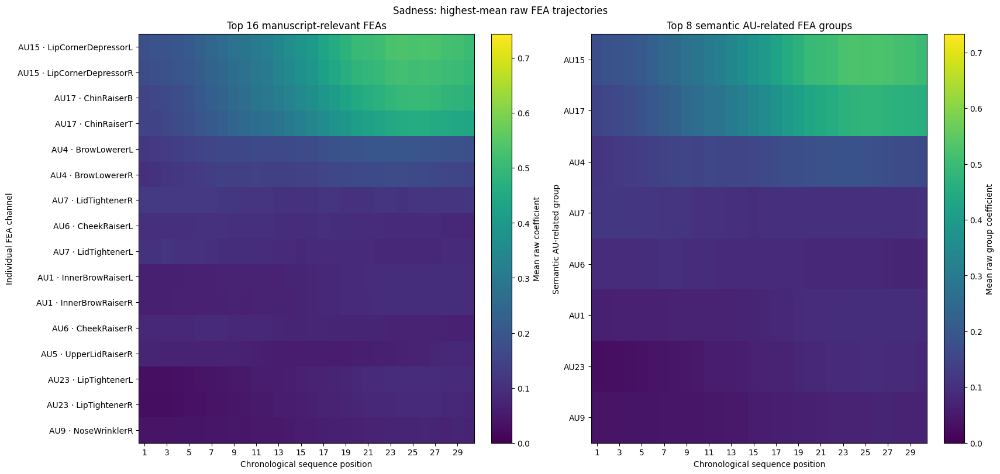

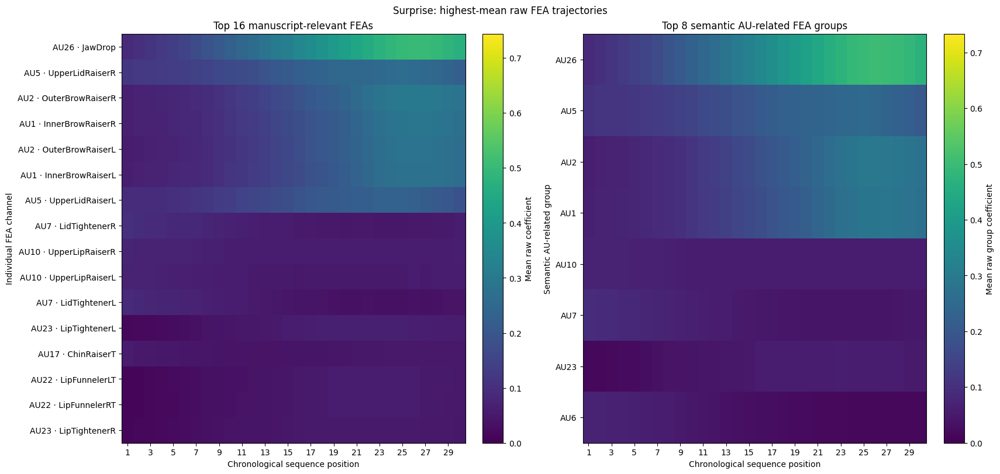

,true_label,type,rank,feature,au_code,mean_raw_value
0,Anger,FEA,1,BrowLowererL,AU4,0.3123
1,Anger,FEA,2,BrowLowererR,AU4,0.2900
2,Anger,FEA,3,LidTightenerR,AU7,0.2824
3,Anger,FEA,4,LidTightenerL,AU7,0.2755
4,Anger,FEA,5,ChinRaiserT,AU17,0.2707
...,...,...,...,...,...,...
163,Surprise,AU group,4,AU1,AU1,0.1755
164,Surprise,AU group,5,AU10,AU10,0.0603
165,Surprise,AU group,6,AU7,AU7,0.0577
166,Surprise,AU group,7,AU23,AU23,0.0458


In [7]:
# Additional focused trajectory plots:
# For each expression category, retain only the 16 manuscript-relevant FEAs
# and 8 semantic AU-related groups with the highest mean activation across
# the 30 sequence positions.
#
# Selection is performed separately per category.
# The heatmaps still use the same global color scales as Section 6 so that
# absolute raw coefficient magnitudes remain comparable across categories.

TOP_N_FEAS = 16
TOP_N_AUS = 8

top_feature_rows = []

for category in CATEGORY_ORDER:
    category_fea = focused_fea_trajectory.loc[category]
    category_groups = group_trajectory.loc[category]

    # Rank channels/groups by their mean raw activation across all 30 steps.
    top_feas = (
        category_fea.mean(axis=0)
        .sort_values(ascending=False)
        .head(TOP_N_FEAS)
        .index
        .tolist()
    )

    top_aus = (
        category_groups.mean(axis=0)
        .sort_values(ascending=False)
        .head(TOP_N_AUS)
        .index
        .tolist()
    )

    # Store the selection for reproducibility.
    for rank, fea_name in enumerate(top_feas, start=1):
        mapping_row = fea_label_lookup.loc[fea_name]
        top_feature_rows.append(
            {
                "true_label": category,
                "type": "FEA",
                "rank": rank,
                "feature": fea_name,
                "au_code": mapping_row["au_code"],
                "mean_raw_value": category_fea[fea_name].mean(),
            }
        )

    for rank, au_code in enumerate(top_aus, start=1):
        top_feature_rows.append(
            {
                "true_label": category,
                "type": "AU group",
                "rank": rank,
                "feature": au_code,
                "au_code": au_code,
                "mean_raw_value": category_groups[au_code].mean(),
            }
        )

    fea_matrix = category_fea[top_feas].T
    group_matrix = category_groups[top_aus].T

    fea_labels = [
        f"{fea_label_lookup.loc[fea_name, 'au_code']} · {fea_name}"
        for fea_name in top_feas
    ]

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(17, 8),
        layout="constrained",
    )

    # Top 16 individual manuscript-relevant FEAs.
    image_1 = axes[0].imshow(
        fea_matrix.to_numpy(),
        aspect="auto",
        vmin=0,
        vmax=focused_vmax,
    )

    axes[0].set_xticks(
        np.arange(0, 30, 2),
        np.arange(1, 31, 2),
    )
    axes[0].set_yticks(
        np.arange(len(fea_labels)),
        fea_labels,
    )
    axes[0].set_xlabel("Chronological sequence position")
    axes[0].set_ylabel("Individual FEA channel")
    axes[0].set_title(
        f"Top {TOP_N_FEAS} manuscript-relevant FEAs"
    )

    fig.colorbar(
        image_1,
        ax=axes[0],
        label="Mean raw coefficient",
    )

    # Top 8 semantic AU-related FEA groups.
    image_2 = axes[1].imshow(
        group_matrix.to_numpy(),
        aspect="auto",
        vmin=0,
        vmax=group_vmax,
    )

    axes[1].set_xticks(
        np.arange(0, 30, 2),
        np.arange(1, 31, 2),
    )
    axes[1].set_yticks(
        np.arange(len(top_aus)),
        top_aus,
    )
    axes[1].set_xlabel("Chronological sequence position")
    axes[1].set_ylabel("Semantic AU-related group")
    axes[1].set_title(
        f"Top {TOP_N_AUS} semantic AU-related FEA groups"
    )

    fig.colorbar(
        image_2,
        ax=axes[1],
        label="Mean raw group coefficient",
    )

    fig.suptitle(
        f"{category}: highest-mean raw FEA trajectories"
    )

    fig.savefig(
        FIGURE_DIR
        / f"focused_top_fea_trajectories_{category.lower()}.png",
        dpi=180,
    )

    plt.show()


top_trajectory_features = pd.DataFrame(top_feature_rows)

top_trajectory_features.to_csv(
    TABLE_DIR / "top_mean_trajectory_features_by_category.csv",
    index=False,
)

display(top_trajectory_features)

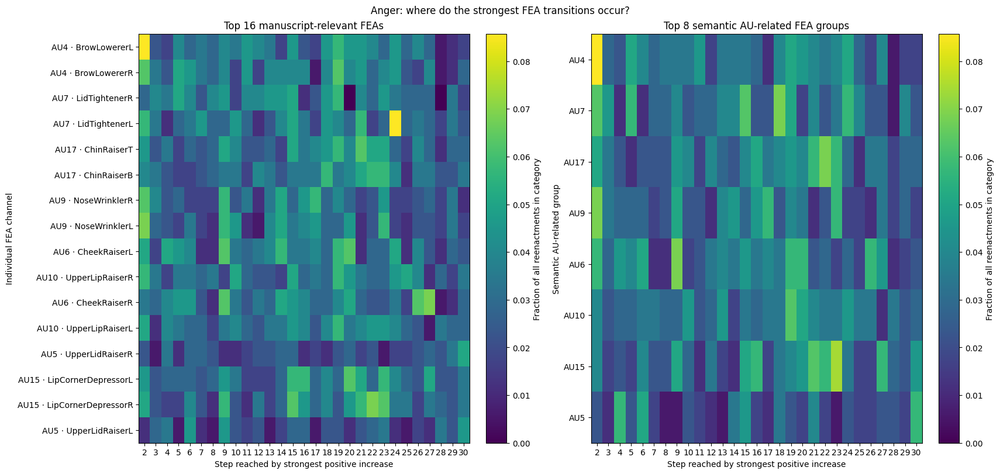

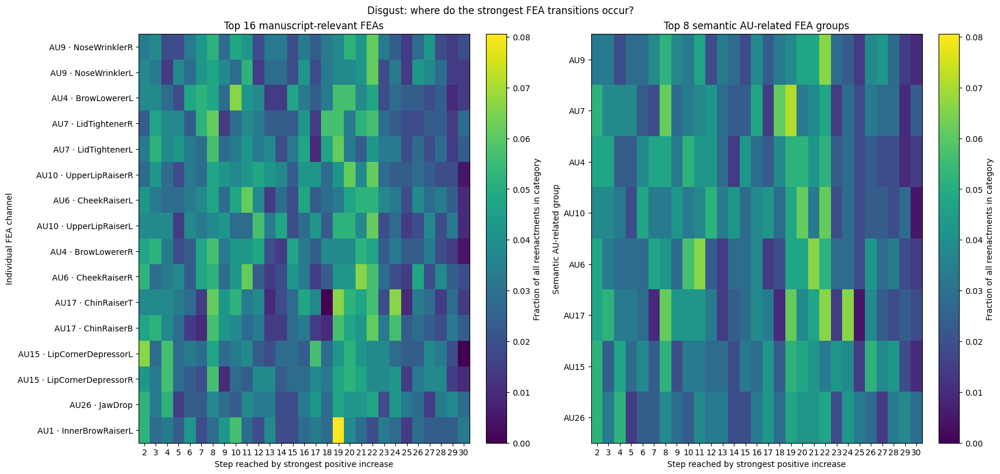

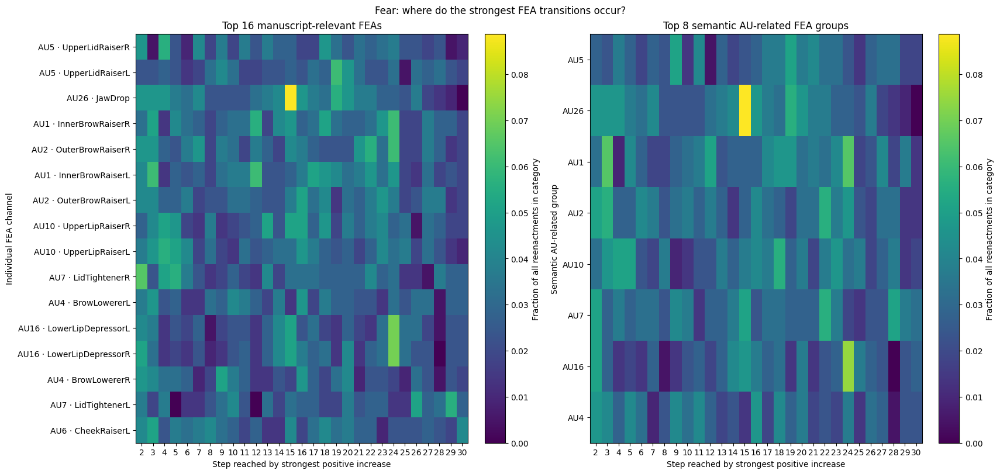

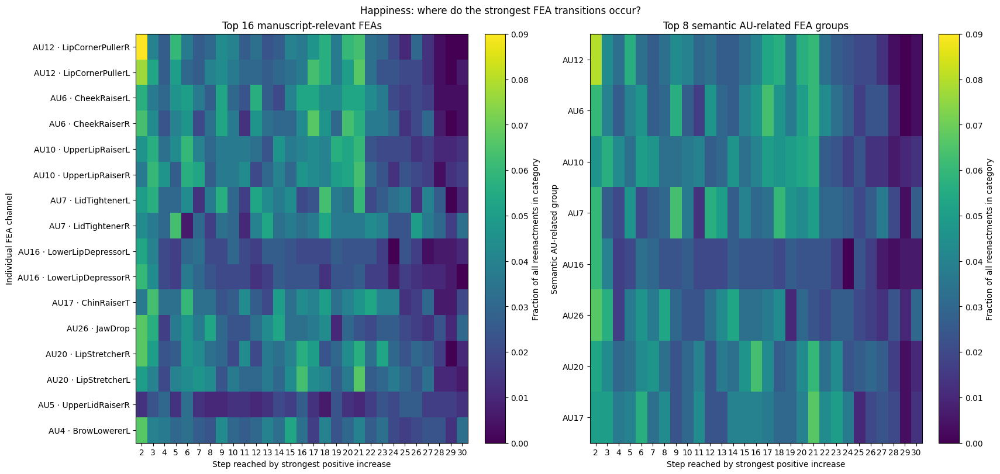

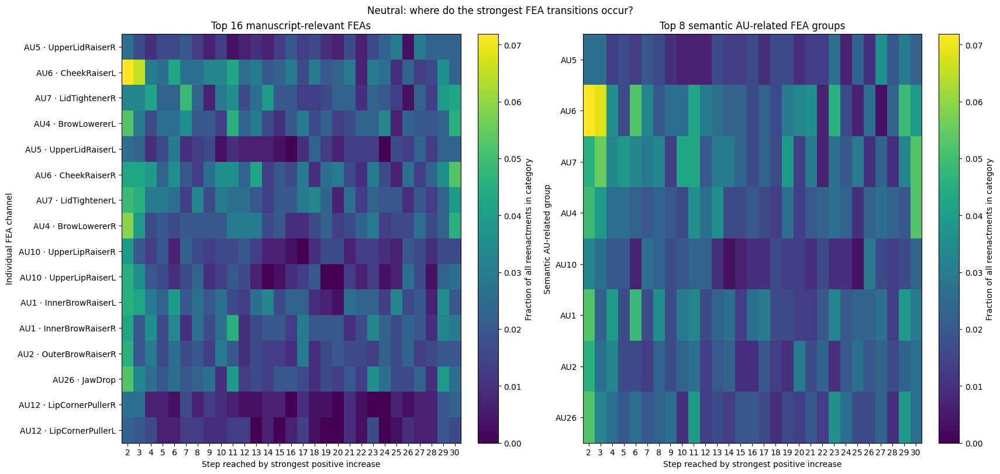

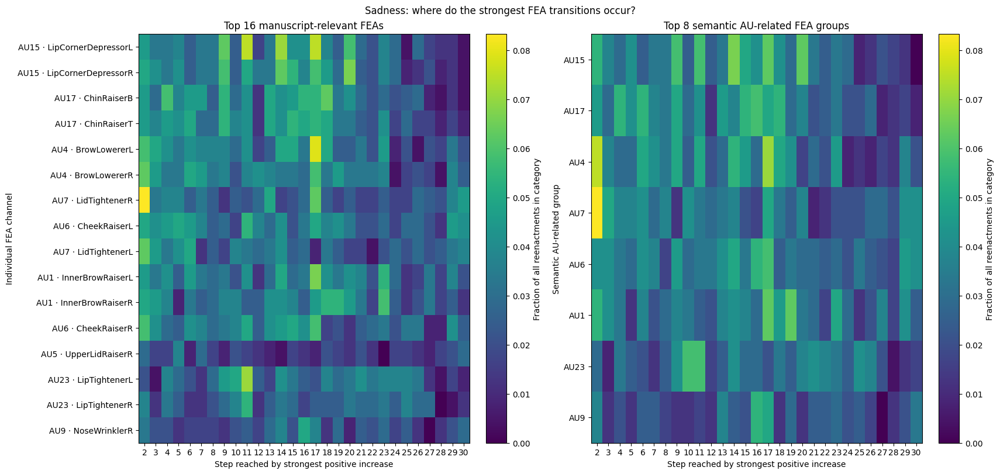

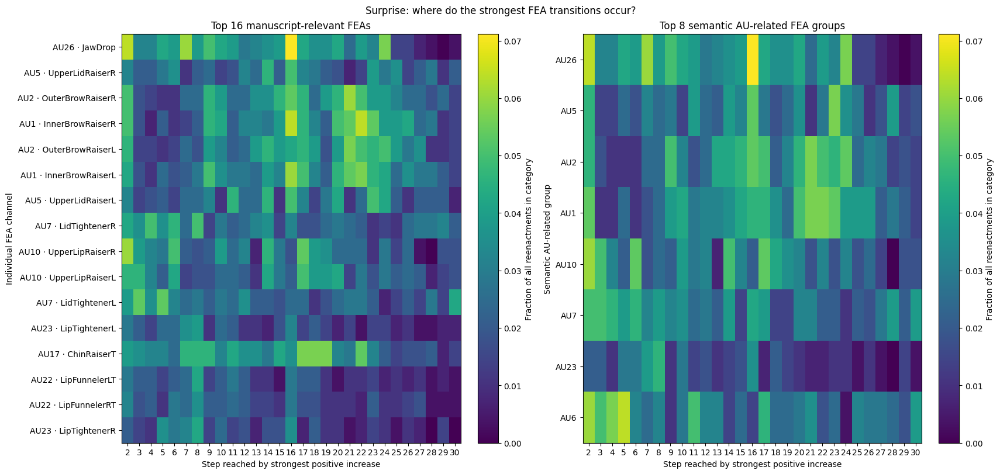

,true_label,type,rank,feature,au_code,mean_raw_value
0,Anger,FEA,1,BrowLowererL,AU4,0.3123
1,Anger,FEA,2,BrowLowererR,AU4,0.2900
2,Anger,FEA,3,LidTightenerR,AU7,0.2824
3,Anger,FEA,4,LidTightenerL,AU7,0.2755
4,Anger,FEA,5,ChinRaiserT,AU17,0.2707
...,...,...,...,...,...,...
163,Surprise,AU group,4,AU1,AU1,0.1755
164,Surprise,AU group,5,AU10,AU10,0.0603
165,Surprise,AU group,6,AU7,AU7,0.0577
166,Surprise,AU group,7,AU23,AU23,0.0458


,fea_name,step_reached_by_strongest_positive_increase,fraction_of_all_reenactments_in_category,true_label,type,au_code
0,BrowLowererL,2,0.0857,Anger,FEA,NaN
1,BrowLowererR,2,0.0629,Anger,FEA,NaN
2,LidTightenerR,2,0.0286,Anger,FEA,NaN
3,LidTightenerL,2,0.0571,Anger,FEA,NaN
4,ChinRaiserT,2,0.0457,Anger,FEA,NaN
5,ChinRaiserB,2,0.0400,Anger,FEA,NaN
6,NoseWrinklerR,2,0.0629,Anger,FEA,NaN
7,NoseWrinklerL,2,0.0686,Anger,FEA,NaN
8,CheekRaiserL,2,0.0514,Anger,FEA,NaN
9,UpperLipRaiserR,2,0.0571,Anger,FEA,NaN


In [8]:
# ---------------------------------------------------------------------
# Configuration
# ---------------------------------------------------------------------

TOP_N_FEAS = 16
TOP_N_AUS = 8

MIN_POSITIVE_DELTA = 0.0   # use > 0.0; increase if you want to ignore tiny changes

FIGURE_SIZE = (17, 8)
FIGURE_DPI = 180

TRANSITION_STEPS = list(range(2, 31))  # column 2 means transition 1 -> 2


# ---------------------------------------------------------------------
# Helper: strongest positive one-step increase per sample
# ---------------------------------------------------------------------

def strongest_positive_jump_steps(pivot, min_positive_delta=MIN_POSITIVE_DELTA):
    """
    Parameters
    ----------
    pivot : pd.DataFrame
        Rows = reenactment_id, columns = timesteps 1..30, values = signal values
    min_positive_delta : float
        Minimum positive one-step increase required to count as an event

    Returns
    -------
    pd.Series
        Index = reenactment_id
        Value = timestep reached by strongest positive increase
                (e.g. 2 means transition 1 -> 2),
                NaN if no positive increase exceeds the threshold
    """
    deltas = pivot.diff(axis=1)  # column t = value(t) - value(t-1)
    max_increase = deltas.max(axis=1)

    jump_step = deltas.idxmax(axis=1).where(
        max_increase.gt(min_positive_delta)
    )

    return jump_step


def jump_step_fraction_matrix(frame, features, step_columns=TRANSITION_STEPS, min_positive_delta=MIN_POSITIVE_DELTA):
    """
    Build a heatmap matrix with:
    rows    = features
    columns = transition steps
    values  = fraction of all reenactments in the category
              whose strongest positive one-step increase occurs at that step
    """
    n_reenactments = frame["reenactment_id"].nunique()
    rows = []

    for feature in features:
        pivot = (
            frame.pivot(
                index="reenactment_id",
                columns="timestep",
                values=feature,
            )
            .reindex(columns=TIMESTEPS)
        )

        jump_steps = strongest_positive_jump_steps(
            pivot,
            min_positive_delta=min_positive_delta,
        )

        counts = (
            jump_steps.value_counts(dropna=True)
            .reindex(step_columns, fill_value=0)
            .astype(float)
        )

        fractions = counts / n_reenactments
        rows.append(fractions)

    matrix = pd.DataFrame(
        rows,
        index=features,
        columns=step_columns,
    )

    return matrix


# ---------------------------------------------------------------------
# Build top-N selections and plot strongest-transition heatmaps
# ---------------------------------------------------------------------

transition_feature_rows = []
all_transition_matrices = []

for category in CATEGORY_ORDER:
    category_fea = focused_fea_trajectory.loc[category]
    category_groups = group_trajectory.loc[category]

    category_data = all_dfea.loc[
        all_dfea["true_label"].eq(category)
    ].copy()

    category_group_data = all_dfea_groups.loc[
        all_dfea_groups["true_label"].eq(category)
    ].copy()

    # -------------------------------------------------------------
    # Rank by mean raw activation across all 30 steps
    # -------------------------------------------------------------

    top_feas = (
        category_fea.mean(axis=0)
        .sort_values(ascending=False)
        .head(TOP_N_FEAS)
        .index
        .tolist()
    )

    top_aus = (
        category_groups.mean(axis=0)
        .sort_values(ascending=False)
        .head(TOP_N_AUS)
        .index
        .tolist()
    )

    # Store selections for reproducibility
    for rank, fea_name in enumerate(top_feas, start=1):
        mapping_row = fea_label_lookup.loc[fea_name]
        transition_feature_rows.append(
            {
                "true_label": category,
                "type": "FEA",
                "rank": rank,
                "feature": fea_name,
                "au_code": mapping_row["au_code"],
                "mean_raw_value": category_fea[fea_name].mean(),
            }
        )

    for rank, au_code in enumerate(top_aus, start=1):
        transition_feature_rows.append(
            {
                "true_label": category,
                "type": "AU group",
                "rank": rank,
                "feature": au_code,
                "au_code": au_code,
                "mean_raw_value": category_groups[au_code].mean(),
            }
        )

    # -------------------------------------------------------------
    # Compute strongest-transition heatmap matrices
    # -------------------------------------------------------------

    fea_transition_matrix = jump_step_fraction_matrix(
        category_data,
        top_feas,
        step_columns=TRANSITION_STEPS,
        min_positive_delta=MIN_POSITIVE_DELTA,
    )

    au_transition_matrix = jump_step_fraction_matrix(
        category_group_data,
        top_aus,
        step_columns=TRANSITION_STEPS,
        min_positive_delta=MIN_POSITIVE_DELTA,
    )

    fea_labels = [
        f"{fea_label_lookup.loc[fea_name, 'au_code']} · {fea_name}"
        for fea_name in top_feas
    ]

    fea_transition_matrix_labeled = fea_transition_matrix.copy()
    fea_transition_matrix_labeled.index = fea_labels

    # Save long-format tables
    fea_transition_long = (
        fea_transition_matrix
        .reset_index(names="fea_name")
        .melt(
            id_vars="fea_name",
            var_name="step_reached_by_strongest_positive_increase",
            value_name="fraction_of_all_reenactments_in_category",
        )
    )
    fea_transition_long["true_label"] = category
    fea_transition_long["type"] = "FEA"

    au_transition_long = (
        au_transition_matrix
        .reset_index(names="au_code")
        .melt(
            id_vars="au_code",
            var_name="step_reached_by_strongest_positive_increase",
            value_name="fraction_of_all_reenactments_in_category",
        )
    )
    au_transition_long["true_label"] = category
    au_transition_long["type"] = "AU group"

    all_transition_matrices.append(fea_transition_long)
    all_transition_matrices.append(au_transition_long)

    # -------------------------------------------------------------
    # Shared vmax within the figure for easier comparison
    # -------------------------------------------------------------

    joint_vmax = max(
        float(fea_transition_matrix.to_numpy().max()),
        float(au_transition_matrix.to_numpy().max()),
    )

    # -------------------------------------------------------------
    # Plot
    # -------------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=FIGURE_SIZE,
        layout="constrained",
    )

    # Left: FEAs
    image_1 = axes[0].imshow(
        fea_transition_matrix_labeled.to_numpy(),
        aspect="auto",
        vmin=0,
        vmax=joint_vmax,
    )

    axes[0].set_xticks(
        np.arange(len(TRANSITION_STEPS)),
        TRANSITION_STEPS,
    )
    axes[0].set_yticks(
        np.arange(len(fea_labels)),
        fea_labels,
    )
    axes[0].set_xlabel("Step reached by strongest positive increase")
    axes[0].set_ylabel("Individual FEA channel")
    axes[0].set_title(
        f"Top {TOP_N_FEAS} manuscript-relevant FEAs"
    )

    fig.colorbar(
        image_1,
        ax=axes[0],
        label="Fraction of all reenactments in category",
    )

    # Right: AU groups
    image_2 = axes[1].imshow(
        au_transition_matrix.to_numpy(),
        aspect="auto",
        vmin=0,
        vmax=joint_vmax,
    )

    axes[1].set_xticks(
        np.arange(len(TRANSITION_STEPS)),
        TRANSITION_STEPS,
    )
    axes[1].set_yticks(
        np.arange(len(top_aus)),
        top_aus,
    )
    axes[1].set_xlabel("Step reached by strongest positive increase")
    axes[1].set_ylabel("Semantic AU-related group")
    axes[1].set_title(
        f"Top {TOP_N_AUS} semantic AU-related FEA groups"
    )

    fig.colorbar(
        image_2,
        ax=axes[1],
        label="Fraction of all reenactments in category",
    )

    fig.suptitle(
        f"{category}: where do the strongest FEA transitions occur?"
    )

    fig.savefig(
        FIGURE_DIR / f"focused_top_fea_transition_steps_{category.lower()}.png",
        dpi=FIGURE_DPI,
    )

    plt.show()


# ---------------------------------------------------------------------
# Save feature selection and long-format transition tables
# ---------------------------------------------------------------------

top_transition_features = pd.DataFrame(
    transition_feature_rows
)

top_transition_features.to_csv(
    TABLE_DIR / "top_mean_transition_features_by_category.csv",
    index=False,
)

transition_step_heatmaps_long = pd.concat(
    all_transition_matrices,
    ignore_index=True,
)

transition_step_heatmaps_long.to_csv(
    TABLE_DIR / "focused_fea_transition_step_heatmaps_long.csv",
    index=False,
)

display(top_transition_features)
display(transition_step_heatmaps_long.head(20))

## 7. Participant-balanced trajectory robustness

The participant-balanced profile first averages within Participant × Category × Timestep and then gives each participant equal weight.

This changes the weighting of reenactments; it does not normalize the coefficients.


In [9]:
participant_category_step = (
    all_dfea.groupby(["participant_id", "true_label", "timestep"], observed=True)[PAPER_AU_FEA_COLUMNS]
    .mean()
    .reset_index()
)

participant_balanced_trajectory = (
    participant_category_step.groupby(["true_label", "timestep"], observed=True)[PAPER_AU_FEA_COLUMNS]
    .mean()
    .reindex(pd.MultiIndex.from_product([CATEGORY_ORDER, TIMESTEPS], names=["true_label", "timestep"]))
)

robustness_rows = []
for category in CATEGORY_ORDER:
    sample_values = focused_fea_trajectory.loc[category].to_numpy().ravel()
    participant_values = participant_balanced_trajectory.loc[category].to_numpy().ravel()

    robustness_rows.append(
        {
            "category": category,
            "profile_correlation": np.corrcoef(sample_values, participant_values)[0, 1],
            "mean_absolute_difference": np.mean(np.abs(sample_values - participant_values)),
            "max_absolute_difference": np.max(np.abs(sample_values - participant_values)),
        }
    )

trajectory_robustness = pd.DataFrame(robustness_rows)
trajectory_robustness.to_csv(
    TABLE_DIR / "participant_balanced_trajectory_robustness.csv", index=False
)

participant_balanced_trajectory.reset_index().melt(
    id_vars=["true_label", "timestep"], var_name="fea_name", value_name="raw_mean"
).to_csv(TABLE_DIR / "paper_relevant_fea_participant_balanced_trajectories_raw.csv", index=False)

display(trajectory_robustness)


,category,profile_correlation,mean_absolute_difference,max_absolute_difference
0,Anger,0.9972,0.0080,0.0432
1,Disgust,0.9971,0.0062,0.0402
2,Fear,0.9950,0.0049,0.0284
3,Happiness,0.9999,0.0019,0.0112
4,Neutral,0.9993,0.0006,0.0047
5,Sadness,0.9962,0.0068,0.0286
6,Surprise,0.9994,0.0026,0.0149


## 8. Select category-associated manuscript-relevant FEAs for sample-level trajectory inspection

To avoid visually inspecting all 35 manuscript-relevant FEA channels for every category, the notebook selects the three channels with the largest **standardized sequence-mean value** for each category.

The selection criterion matches the cross-channel logic used in the preceding category-pattern analysis: standardization is used only to identify comparatively category-associated channels. The trajectory plots themselves remain on the **raw coefficient scale**.


In [10]:
sequence_mean = (
    all_dfea.groupby(["reenactment_id", "true_label"], observed=True)[PAPER_AU_FEA_COLUMNS]
    .mean()
    .reset_index()
)

pooled_mean = sequence_mean[PAPER_AU_FEA_COLUMNS].mean()
pooled_sd = sequence_mean[PAPER_AU_FEA_COLUMNS].std(ddof=1)

standardized_sequence_mean = sequence_mean.copy()
standardized_sequence_mean[PAPER_AU_FEA_COLUMNS] = (
    standardized_sequence_mean[PAPER_AU_FEA_COLUMNS] - pooled_mean
) / pooled_sd

category_standardized_mean = (
    standardized_sequence_mean.groupby("true_label", observed=True)[PAPER_AU_FEA_COLUMNS]
    .mean()
    .reindex(CATEGORY_ORDER)
)

selected_feature_rows = []
for category in CATEGORY_ORDER:
    top_features = category_standardized_mean.loc[category].sort_values(ascending=False).head(3)

    for rank, (fea_name, standardized_value) in enumerate(top_features.items(), start=1):
        mapping_row = fea_label_lookup.loc[fea_name]
        expected_categories = {
            value.strip()
            for value in str(mapping_row["paper_expression_categories"]).split("|")
        }

        selected_feature_rows.append(
            {
                "true_label": category,
                "rank": rank,
                "fea_name": fea_name,
                "au_code": mapping_row["au_code"],
                "au_name": mapping_row["au_name"],
                "standardized_sequence_mean": standardized_value,
                "listed_for_category_in_table_1": category in expected_categories,
            }
        )

selected_features = pd.DataFrame(selected_feature_rows)
selected_features.to_csv(TABLE_DIR / "selected_category_associated_feas.csv", index=False)
display(selected_features)


,true_label,rank,fea_name,au_code,au_name,standardized_sequence_mean,listed_for_category_in_table_1
0,Anger,1,BrowLowererR,AU4,Brow Lowerer,1.0882,True
1,Anger,2,BrowLowererL,AU4,Brow Lowerer,1.0657,True
2,Anger,3,LidTightenerL,AU7,Lid Tightener,0.8397,True
3,Disgust,1,NoseWrinklerL,AU9,Nose Wrinkler,1.4619,True
4,Disgust,2,NoseWrinklerR,AU9,Nose Wrinkler,1.4569,True
5,Disgust,3,BrowLowererL,AU4,Brow Lowerer,1.0083,False
6,Fear,1,OuterBrowRaiserR,AU2,Outer Brow Raiser,0.7140,True
7,Fear,2,UpperLidRaiserR,AU5,Upper Lid Raiser,0.6939,True
8,Fear,3,OuterBrowRaiserL,AU2,Outer Brow Raiser,0.6898,True
9,Happiness,1,LipCornerPullerR,AU12,Lip Corner Puller,1.7416,True


## 9. Individual FEA trajectories: smooth category means versus heterogeneous sample transitions

For each category, the three selected FEAs are shown in two ways:

- **absolute sequence position:** every reenactment trajectory plus the category mean;
- **sample-event alignment:** each reenactment is aligned to its own largest positive one-step increase in that FEA.

The event-aligned view directly tests whether the smooth category-average trajectory can arise from sharper individual transitions occurring at different sequence positions.

The event is called the **largest within-window increase**. It is not interpreted as an expression onset or apex.


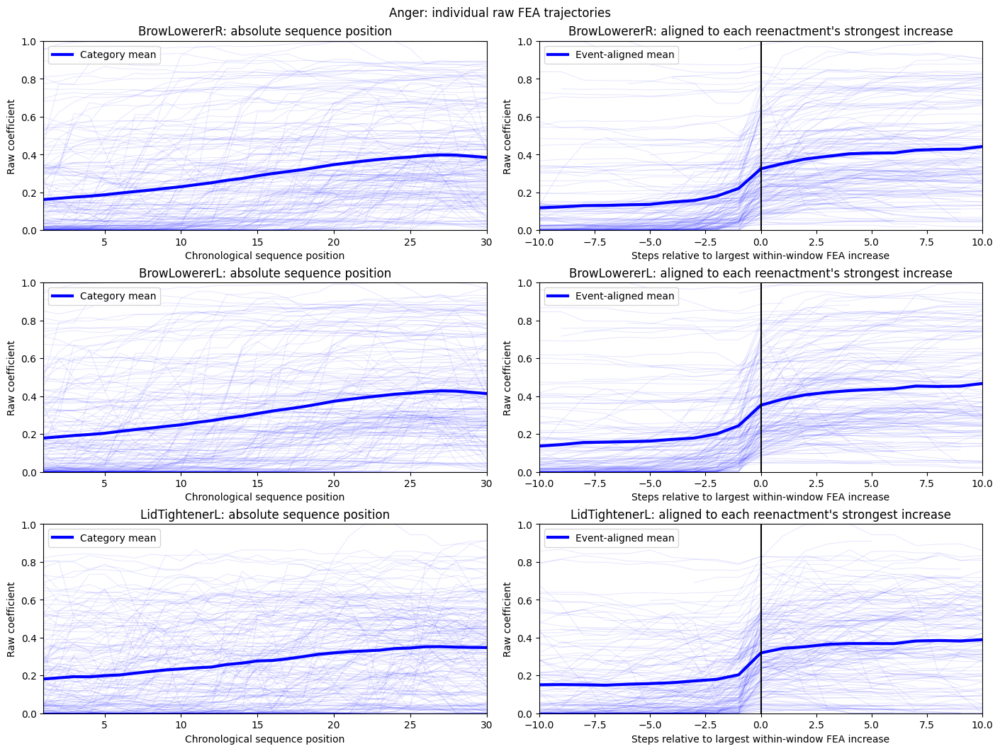

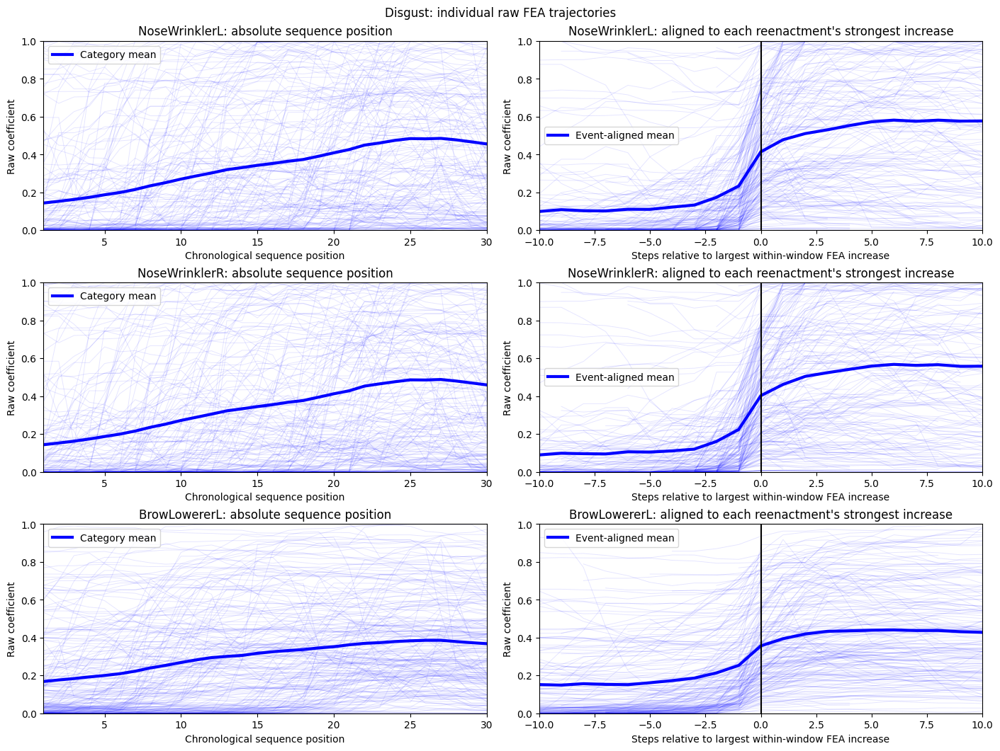

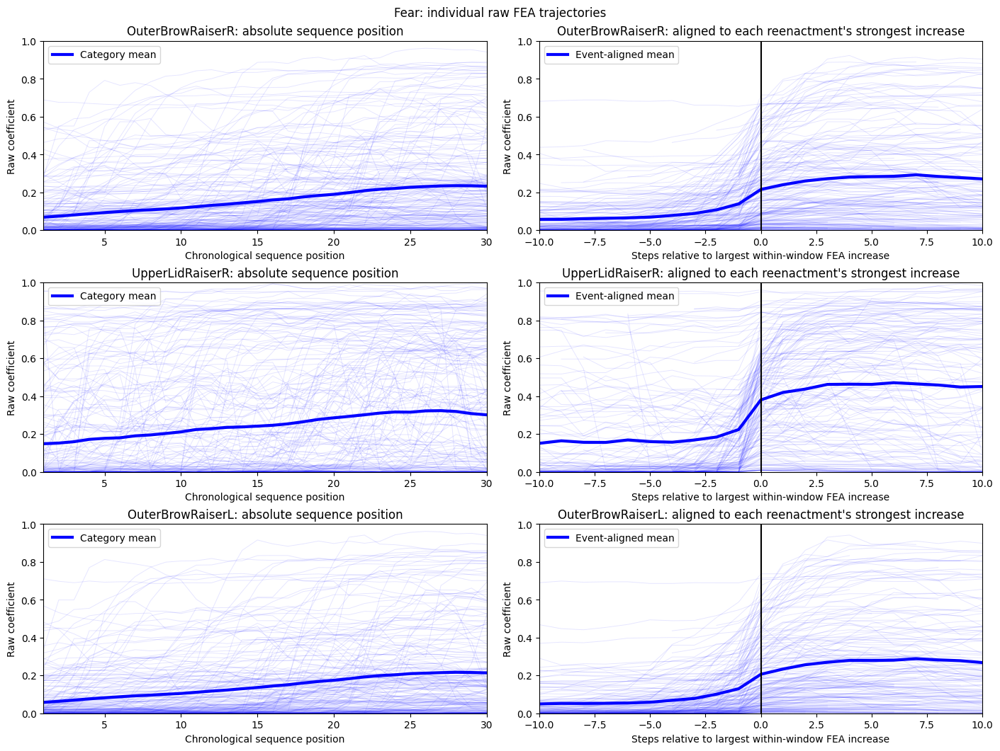

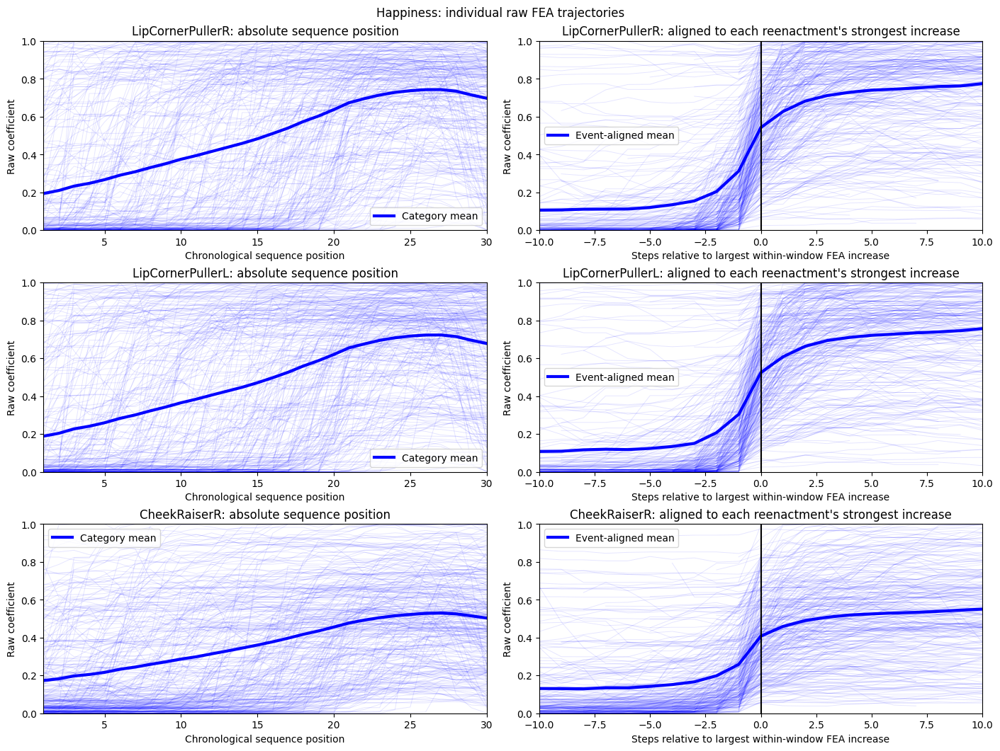

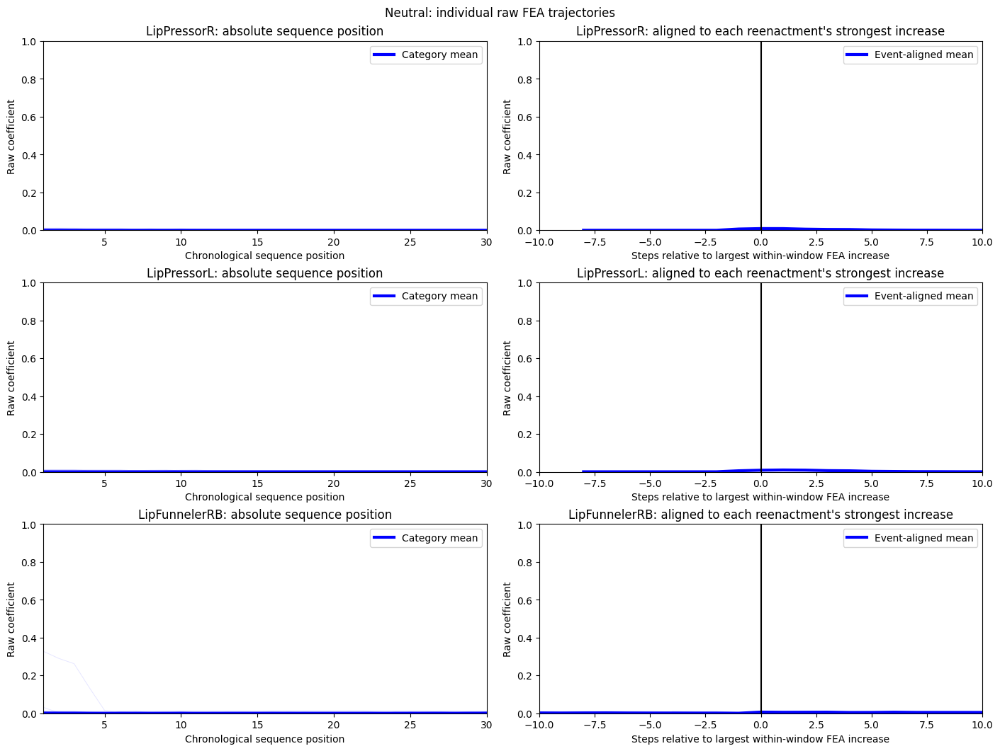

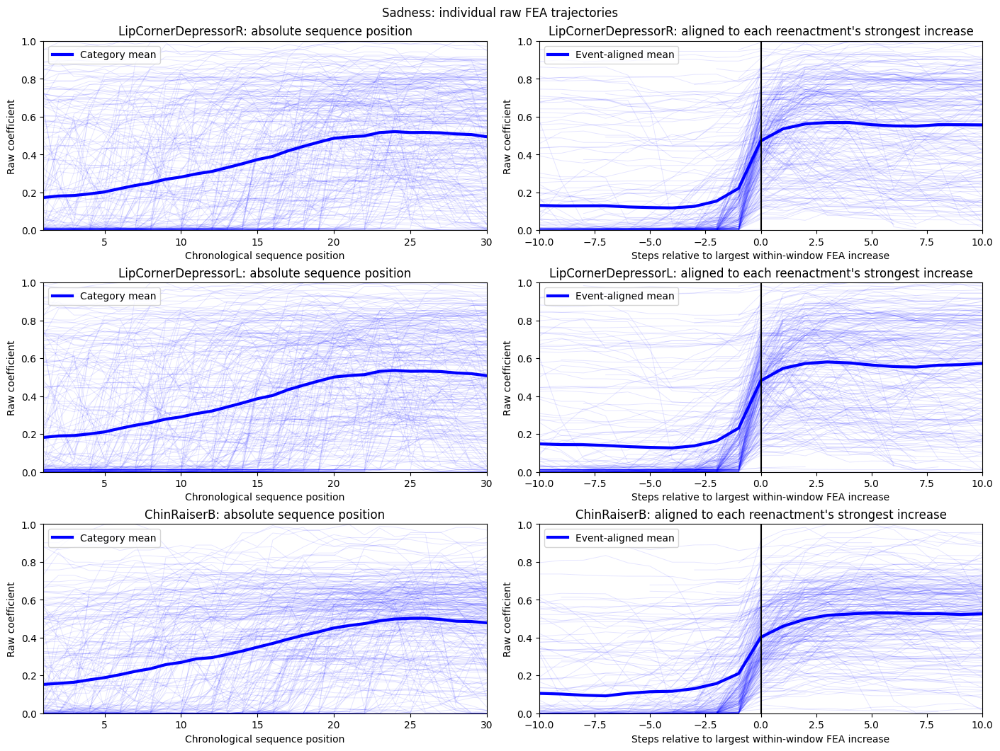

In [ ]:
EVENT_WINDOW = 10

SAMPLE_LINE_ALPHA = 0.10
SAMPLE_LINE_WIDTH = 0.7
SAMPLE_LINE_COLOR = "blue"

MEAN_LINE_WIDTH = 3.0
MEAN_LINE_COLOR = "blue"

EVENT_LINE_WIDTH = 1.5
EVENT_LINE_COLOR = "black"


def event_aligned_series(frame, value_col, event_step_lookup, window=EVENT_WINDOW):
    aligned_rows = []

    for reenactment_id, sample in frame.groupby("reenactment_id", sort=False):
        event_step = event_step_lookup.get(reenactment_id)
        if pd.isna(event_step):
            continue

        sample = sample.sort_values("timestep")

        for _, row in sample.iterrows():
            relative_step = int(row["timestep"] - event_step)

            if -window <= relative_step <= window:
                aligned_rows.append(
                    {
                        "reenactment_id": reenactment_id,
                        "relative_step": relative_step,
                        "value": row[value_col],
                    }
                )

    return pd.DataFrame(aligned_rows)


fea_transition_rows = []

for category in CATEGORY_ORDER:
    category_features = selected_features.loc[
        selected_features["true_label"].eq(category),
        "fea_name",
    ].tolist()

    category_data = all_dfea.loc[
        all_dfea["true_label"].eq(category)
    ].copy()

    fig, axes = plt.subplots(
        len(category_features),
        2,
        figsize=(14, 3.5 * len(category_features)),
        layout="constrained",
    )

    if len(category_features) == 1:
        axes = np.array([axes])

    for row_index, fea_name in enumerate(category_features):
        pivot = (
            category_data
            .pivot(
                index="reenactment_id",
                columns="timestep",
                values=fea_name,
            )
            .reindex(columns=TIMESTEPS)
        )

        mean_curve = pivot.mean(axis=0)
        deltas = pivot.diff(axis=1)

        max_increase = deltas.max(axis=1)
        max_increase_step = deltas.idxmax(axis=1).where(
            max_increase.gt(0)
        )

        max_abs_change = deltas.abs().max(axis=1)
        max_abs_change_step = deltas.abs().idxmax(axis=1)

        mean_curve_delta = mean_curve.diff()
        mean_curve_max_increase = mean_curve_delta.max()
        mean_curve_max_abs_change = mean_curve_delta.abs().max()

        for reenactment_id in pivot.index:
            fea_transition_rows.append(
                {
                    "reenactment_id": reenactment_id,
                    "true_label": category,
                    "fea_name": fea_name,
                    "max_positive_step_change": max_increase.loc[
                        reenactment_id
                    ],
                    "step_of_max_positive_change": max_increase_step.loc[
                        reenactment_id
                    ],
                    "max_absolute_step_change": max_abs_change.loc[
                        reenactment_id
                    ],
                    "step_of_max_absolute_change": max_abs_change_step.loc[
                        reenactment_id
                    ],
                    "step_of_max_value": pivot.loc[
                        reenactment_id
                    ].idxmax(),
                    "max_value": pivot.loc[
                        reenactment_id
                    ].max(),
                }
            )

        # -------------------------------------------------------------
        # Absolute sequence-position plot
        # -------------------------------------------------------------

        ax = axes[row_index, 0]

        for _, values in pivot.iterrows():
            ax.plot(
                TIMESTEPS,
                values.to_numpy(),
                alpha=SAMPLE_LINE_ALPHA,
                linewidth=SAMPLE_LINE_WIDTH,
                color=SAMPLE_LINE_COLOR,
            )

        ax.plot(
            TIMESTEPS,
            mean_curve.to_numpy(),
            linewidth=MEAN_LINE_WIDTH,
            color=MEAN_LINE_COLOR,
            label="Category mean",
        )

        ax.set(
            xlabel="Chronological sequence position",
            ylabel="Raw coefficient",
            title=f"{fea_name}: absolute sequence position",
            xlim=(1, 30),
            ylim=(0, 1),
        )

        ax.legend()

        # -------------------------------------------------------------
        # Event-aligned plot
        # -------------------------------------------------------------

        event_lookup = max_increase_step.to_dict()

        aligned = event_aligned_series(
            category_data[
                [
                    "reenactment_id",
                    "timestep",
                    fea_name,
                ]
            ],
            fea_name,
            event_lookup,
            window=EVENT_WINDOW,
        )

        ax = axes[row_index, 1]

        if not aligned.empty:
            aligned_pivot = aligned.pivot(
                index="reenactment_id",
                columns="relative_step",
                values="value",
            )

            aligned_pivot = aligned_pivot.reindex(
                columns=range(
                    -EVENT_WINDOW,
                    EVENT_WINDOW + 1,
                )
            )

            for _, values in aligned_pivot.iterrows():
                ax.plot(
                    aligned_pivot.columns,
                    values.to_numpy(),
                    alpha=SAMPLE_LINE_ALPHA,
                    linewidth=SAMPLE_LINE_WIDTH,
                    color=SAMPLE_LINE_COLOR,
                )

            ax.plot(
                aligned_pivot.columns,
                aligned_pivot.mean(axis=0),
                linewidth=MEAN_LINE_WIDTH,
                color=MEAN_LINE_COLOR,
                label="Event-aligned mean",
            )

        ax.axvline(
            0,
            linewidth=EVENT_LINE_WIDTH,
            color=EVENT_LINE_COLOR,
        )

        ax.set(
            xlabel="Steps relative to largest within-window FEA increase",
            ylabel="Raw coefficient",
            title=f"{fea_name}: aligned to each reenactment's strongest increase",
            xlim=(-EVENT_WINDOW, EVENT_WINDOW),
            ylim=(0, 1),
        )

        ax.legend()

        fea_transition_rows[-1][
            "mean_curve_max_positive_step_change"
        ] = mean_curve_max_increase

        fea_transition_rows[-1][
            "mean_curve_max_absolute_step_change"
        ] = mean_curve_max_abs_change

    fig.suptitle(
        f"{category}: individual raw FEA trajectories"
    )

    fig.savefig(
        FIGURE_DIR
        / f"individual_fea_trajectories_{category.lower()}.png",
        dpi=180,
    )

    plt.show()


fea_transition_long = pd.DataFrame(
    fea_transition_rows
)

fea_transition_long.to_csv(
    TABLE_DIR / "sample_level_fea_transition_events.csv",
    index=False,
)

## 10. Quantify how much category averaging smooths individual FEA transitions

For each selected Category × FEA pair, the table compares:

- the largest one-step increase in the **category mean curve**;
- the median and 90th percentile of each reenactment's own largest one-step increase;
- the dispersion of the sequence position at which those sample-level increases occur.

A high sample-level jump relative to the mean-curve jump, together with a broad timing distribution, is the pattern expected when asynchronous individual transitions are smoothed by averaging.


In [ ]:
fea_smoothing_rows = []

for (category, fea_name), group in fea_transition_long.groupby(["true_label", "fea_name"], observed=True):
    valid_steps = group["step_of_max_positive_change"].dropna()

    mean_curve = (
        all_dfea.loc[all_dfea["true_label"].eq(category)]
        .groupby("timestep")[fea_name]
        .mean()
        .reindex(TIMESTEPS)
    )
    mean_curve_max_jump = mean_curve.diff().max()

    median_sample_jump = group["max_positive_step_change"].median()

    fea_smoothing_rows.append(
        {
            "true_label": category,
            "fea_name": fea_name,
            "n_reenactments": len(group),
            "mean_curve_max_positive_step_change": mean_curve_max_jump,
            "median_sample_max_positive_step_change": median_sample_jump,
            "p90_sample_max_positive_step_change": group["max_positive_step_change"].quantile(0.90),
            "median_to_mean_curve_jump_ratio": (
                median_sample_jump / mean_curve_max_jump if mean_curve_max_jump > 0 else np.nan
            ),
            "median_step_of_max_positive_change": valid_steps.median(),
            "q25_step_of_max_positive_change": valid_steps.quantile(0.25),
            "q75_step_of_max_positive_change": valid_steps.quantile(0.75),
            "timing_iqr_steps": valid_steps.quantile(0.75) - valid_steps.quantile(0.25),
            "median_step_of_max_value": group["step_of_max_value"].median(),
        }
    )

fea_smoothing_summary = pd.DataFrame(fea_smoothing_rows)
fea_smoothing_summary.to_csv(TABLE_DIR / "fea_sample_vs_mean_transition_summary.csv", index=False)
display(fea_smoothing_summary)


# Part II — Prediction trajectories and FEA × prediction synthesis

All analyses in this part use the **held-out test set only**.

The prediction CSV was generated by evaluating the frozen trained FEA model on sequence prefixes of length 1 through 30. No padding or artificial observations were added. The 30-observation prefix reproduces the original full-sequence model output.


## 11. Derive sample-level prediction transition measures

Two probability trajectories are distinguished:

- **true-class probability:** probability assigned to the ground-truth category;
- **final-class probability:** probability assigned at every prefix to the class that is ultimately predicted at timestep 30.

For finally correct samples these are the same class. For finally incorrect samples, the final-class probability tracks the emergence of the eventual wrong decision.

The notebook measures the largest one-step probability increase, the first and persistent crossing of high-confidence thresholds, and the first timestep from which the final predicted class never changes again.


In [ ]:
trajectory = prediction_trajectories.sort_values(["sequence_id", "timestep"]).copy()

final_class_lookup = (
    trajectory.loc[trajectory["timestep"].eq(30), ["sequence_id", "predicted_class"]]
    .set_index("sequence_id")["predicted_class"]
)

trajectory["final_predicted_class"] = trajectory["sequence_id"].map(final_class_lookup)
trajectory["final_class_probability"] = np.nan

for category in CATEGORY_ORDER:
    mask = trajectory["final_predicted_class"].eq(category)
    trajectory.loc[mask, "final_class_probability"] = trajectory.loc[
        mask, f"probability_{category.lower()}"
    ]

assert trajectory["final_class_probability"].notna().all()


def first_threshold_step(values, threshold):
    hits = np.flatnonzero(values >= threshold)
    return int(hits[0] + 1) if len(hits) else np.nan


def persistent_threshold_step(values, threshold):
    above = values >= threshold
    for index in range(len(values)):
        if above[index:].all():
            return int(index + 1)
    return np.nan


def stable_final_label_from(predicted_classes):
    final_class = predicted_classes[-1]
    for index in range(len(predicted_classes)):
        if np.all(predicted_classes[index:] == final_class):
            return int(index + 1)
    return np.nan


prediction_transition_rows = []

for sequence_id, sample in trajectory.groupby("sequence_id", sort=False):
    sample = sample.sort_values("timestep")
    true_prob = sample["true_class_probability"].to_numpy()
    final_prob = sample["final_class_probability"].to_numpy()
    predicted_classes = sample["predicted_class"].to_numpy()

    true_delta = np.diff(true_prob)
    final_delta = np.diff(final_prob)

    true_jump_index = int(np.argmax(true_delta)) if len(true_delta) else 0
    final_jump_index = int(np.argmax(final_delta)) if len(final_delta) else 0

    first_80 = first_threshold_step(final_prob, 0.80)
    persistent_80 = persistent_threshold_step(final_prob, 0.80)

    prediction_transition_rows.append(
        {
            "reenactment_id": sequence_id,
            "participant_id": sample["participant_id"].iloc[0],
            "true_label": sample["true_class"].iloc[0],
            "final_predicted_class": sample["final_predicted_class"].iloc[0],
            "correct_final_prediction": bool(sample["correct_final_prediction"].iloc[0]),
            "true_probability_first": true_prob[0],
            "true_probability_final": true_prob[-1],
            "final_class_probability_first": final_prob[0],
            "final_class_probability_final": final_prob[-1],
            "max_true_probability_increase": true_delta[true_jump_index],
            "step_of_max_true_probability_increase": true_jump_index + 2,
            "max_final_class_probability_increase": final_delta[final_jump_index],
            "step_of_max_final_class_probability_increase": final_jump_index + 2,
            "first_final_class_probability_ge_0_50": first_threshold_step(final_prob, 0.50),
            "first_final_class_probability_ge_0_80": first_80,
            "first_final_class_probability_ge_0_90": first_threshold_step(final_prob, 0.90),
            "persistent_final_class_probability_ge_0_80_from": persistent_80,
            "drops_below_0_80_after_first_crossing": (
                False
                if pd.isna(first_80)
                else bool(np.any(final_prob[int(first_80):] < 0.80))
            ),
            "final_label_stable_from": stable_final_label_from(predicted_classes),
            "label_switches": int(np.sum(predicted_classes[1:] != predicted_classes[:-1])),
        }
    )

prediction_transition_summary = pd.DataFrame(prediction_transition_rows)
prediction_transition_summary.to_csv(
    TABLE_DIR / "sample_level_prediction_transition_summary.csv", index=False
)

display(prediction_transition_summary.head())


## 12. Individual probability trajectories and the averaging-smoothing effect

The figures show all individual true-class probability trajectories in each ground-truth category plus the category mean.

The quantitative summary compares the largest one-step increase in the category-average probability curve with the largest one-step increases observed within individual reenactments.


In [ ]:
# ---------------------------------------------------------------------
# Plot configuration
# ---------------------------------------------------------------------

FIGURE_SIZE = (14, 5)

EVENT_WINDOW = 10

SAMPLE_LINE_ALPHA = 0.10
SAMPLE_LINE_WIDTH = 0.8
SAMPLE_LINE_COLOR = "blue"

MEAN_LINE_ALPHA = 1.0
MEAN_LINE_WIDTH = 3.0
MEAN_LINE_COLOR = "blue"

EVENT_LINE_ALPHA = 1.0
EVENT_LINE_WIDTH = 1.5
EVENT_LINE_COLOR = "black"

X_LIM = (1, 30)
Y_LIM = (0, 1)

FIGURE_DPI = 180


# ---------------------------------------------------------------------
# Helper for event alignment
# ---------------------------------------------------------------------

def align_probability_trajectories(
    pivot,
    event_step_lookup,
    window=EVENT_WINDOW,
):
    aligned_rows = []

    for sequence_id, values in pivot.iterrows():
        event_step = event_step_lookup.get(sequence_id)

        if pd.isna(event_step):
            continue

        event_step = int(event_step)

        for timestep, value in values.items():
            relative_step = int(timestep - event_step)

            if -window <= relative_step <= window:
                aligned_rows.append(
                    {
                        "sequence_id": sequence_id,
                        "relative_step": relative_step,
                        "true_class_probability": value,
                    }
                )

    return pd.DataFrame(aligned_rows)


# ---------------------------------------------------------------------
# Probability smoothing analysis
# ---------------------------------------------------------------------

probability_smoothing_rows = []

for category in CATEGORY_ORDER:
    category_data = trajectory.loc[
        trajectory["true_class"].eq(category)
    ]

    pivot = (
        category_data
        .pivot(
            index="sequence_id",
            columns="timestep",
            values="true_class_probability",
        )
        .reindex(columns=TIMESTEPS)
    )

    mean_curve = pivot.mean(axis=0)
    mean_curve_max_jump = mean_curve.diff().max()

    sample_summary = prediction_transition_summary.loc[
        prediction_transition_summary["true_label"].eq(category)
    ]

    median_sample_jump = sample_summary[
        "max_true_probability_increase"
    ].median()

    probability_smoothing_rows.append(
        {
            "true_label": category,
            "n_reenactments": len(pivot),
            "mean_curve_max_true_probability_increase": mean_curve_max_jump,
            "median_sample_max_true_probability_increase": median_sample_jump,
            "p90_sample_max_true_probability_increase": sample_summary[
                "max_true_probability_increase"
            ].quantile(0.90),
            "median_to_mean_curve_jump_ratio": (
                median_sample_jump / mean_curve_max_jump
                if mean_curve_max_jump > 0
                else np.nan
            ),
            "median_step_of_max_true_probability_increase": sample_summary[
                "step_of_max_true_probability_increase"
            ].median(),
            "q25_step_of_max_true_probability_increase": sample_summary[
                "step_of_max_true_probability_increase"
            ].quantile(0.25),
            "q75_step_of_max_true_probability_increase": sample_summary[
                "step_of_max_true_probability_increase"
            ].quantile(0.75),
        }
    )

    # -----------------------------------------------------------------
    # Prepare event-aligned trajectories
    # -----------------------------------------------------------------

    event_step_lookup = (
        sample_summary
        .set_index("reenactment_id")[
            "step_of_max_true_probability_increase"
        ]
        .to_dict()
    )

    aligned = align_probability_trajectories(
        pivot,
        event_step_lookup,
        window=EVENT_WINDOW,
    )

    if not aligned.empty:
        aligned_pivot = (
            aligned
            .pivot(
                index="sequence_id",
                columns="relative_step",
                values="true_class_probability",
            )
            .reindex(
                columns=range(
                    -EVENT_WINDOW,
                    EVENT_WINDOW + 1,
                )
            )
        )

        aligned_mean_curve = aligned_pivot.mean(axis=0)

    # -----------------------------------------------------------------
    # Plot
    # -----------------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        2,
        figsize=FIGURE_SIZE,
        layout="constrained",
    )

    # =============================================================
    # Left: absolute sequence positions
    # =============================================================

    ax = axes[0]

    for _, values in pivot.iterrows():
        ax.plot(
            TIMESTEPS,
            values.to_numpy(),
            alpha=SAMPLE_LINE_ALPHA,
            linewidth=SAMPLE_LINE_WIDTH,
            color=SAMPLE_LINE_COLOR,
        )

    ax.plot(
        TIMESTEPS,
        mean_curve.to_numpy(),
        alpha=MEAN_LINE_ALPHA,
        linewidth=MEAN_LINE_WIDTH,
        color=MEAN_LINE_COLOR,
        label="Category mean",
    )

    ax.set(
        xlabel="Prefix length / chronological sequence position",
        ylabel="True-class probability",
        title="Absolute sequence position",
        xlim=X_LIM,
        ylim=Y_LIM,
    )

    ax.legend()

    # =============================================================
    # Right: aligned to strongest true-class probability increase
    # =============================================================

    ax = axes[1]

    if not aligned.empty:
        for _, values in aligned_pivot.iterrows():
            ax.plot(
                aligned_pivot.columns,
                values.to_numpy(),
                alpha=SAMPLE_LINE_ALPHA,
                linewidth=SAMPLE_LINE_WIDTH,
                color=SAMPLE_LINE_COLOR,
            )

        ax.plot(
            aligned_mean_curve.index,
            aligned_mean_curve.to_numpy(),
            alpha=MEAN_LINE_ALPHA,
            linewidth=MEAN_LINE_WIDTH,
            color=MEAN_LINE_COLOR,
            label="Event-aligned mean",
        )

    ax.axvline(
        0,
        alpha=EVENT_LINE_ALPHA,
        linewidth=EVENT_LINE_WIDTH,
        color=EVENT_LINE_COLOR,
    )

    ax.set(
        xlabel="Steps relative to strongest true-class probability increase",
        ylabel="True-class probability",
        title="Aligned to each reenactment's strongest probability increase",
        xlim=(-EVENT_WINDOW, EVENT_WINDOW),
        ylim=Y_LIM,
    )

    ax.legend()

    # -----------------------------------------------------------------
    # Figure title and save
    # -----------------------------------------------------------------

    fig.suptitle(
        f"{category}: individual true-class probability trajectories"
    )

    fig.savefig(
        FIGURE_DIR
        / f"individual_true_probability_trajectories_{category.lower()}.png",
        dpi=FIGURE_DPI,
    )

    plt.show()


# ---------------------------------------------------------------------
# Save numerical summary
# ---------------------------------------------------------------------

probability_smoothing_summary = pd.DataFrame(
    probability_smoothing_rows
)

probability_smoothing_summary.to_csv(
    TABLE_DIR / "prediction_sample_vs_mean_transition_summary.csv",
    index=False,
)

display(probability_smoothing_summary)

## 13. Where do the rapid true-class probability transitions occur?

The heatmap shows the distribution of each reenactment's **largest positive one-step increase in true-class probability**.

A transition assigned to step `t` corresponds to the probability change from step `t - 1` to step `t`.

This analysis complements the individual probability trajectories by showing whether their strongest increases occur at consistent or heterogeneous chronological sequence positions. Very short prefixes should be interpreted cautiously because the model was trained on complete 30-step sequences rather than independently retrained for each prefix length.


In [ ]:
# ---------------------------------------------------------------------
# Configuration
# ---------------------------------------------------------------------

MIN_PREFIX_LENGTH = 1
FIGURE_SIZE = (13, 4.8)
FIGURE_DPI = 180

# The delta assigned to timestep t is:
# P(true class at t) - P(true class at t - 1)
#
# With MIN_PREFIX_LENGTH = 5, the first eligible transition is 5 -> 6.


# ---------------------------------------------------------------------
# Find strongest positive true-class probability increase per sample
# ---------------------------------------------------------------------

strongest_jump_rows = []

for sequence_id, sample in trajectory.groupby("sequence_id", sort=False):
    sample = sample.sort_values("timestep").copy()

    sample["true_class_probability_delta"] = (
        sample["true_class_probability"].diff()
    )

    # Only consider transitions after the requested minimum prefix length.
    #
    # Example:
    # MIN_PREFIX_LENGTH = 5
    # eligible reached timesteps = 6, 7, ..., 30
    eligible = sample.loc[
        sample["timestep"].gt(MIN_PREFIX_LENGTH)
    ].copy()

    positive = eligible.loc[
        eligible["true_class_probability_delta"].gt(0)
    ]

    if positive.empty:
        strongest_step = np.nan
        strongest_delta = 0.0

    else:
        strongest_row = positive.loc[
            positive["true_class_probability_delta"].idxmax()
        ]

        strongest_step = int(
            strongest_row["timestep"]
        )

        strongest_delta = float(
            strongest_row["true_class_probability_delta"]
        )

    strongest_jump_rows.append(
        {
            "sequence_id": sequence_id,
            "true_label": sample["true_class"].iloc[0],
            "strongest_positive_jump_step": strongest_step,
            "strongest_positive_jump": strongest_delta,
        }
    )


strongest_true_class_jumps = pd.DataFrame(
    strongest_jump_rows
)


# ---------------------------------------------------------------------
# Calculate distribution using ALL reenactments as denominator
# ---------------------------------------------------------------------

eligible_steps = list(
    range(
        MIN_PREFIX_LENGTH + 1,
        31,
    )
)

jump_counts = pd.crosstab(
    strongest_true_class_jumps["true_label"],
    strongest_true_class_jumps["strongest_positive_jump_step"],
).reindex(
    index=CATEGORY_ORDER,
    columns=eligible_steps,
    fill_value=0,
)

category_counts = (
    strongest_true_class_jumps
    .groupby("true_label")
    .size()
    .reindex(CATEGORY_ORDER)
)

jump_step_distribution = jump_counts.div(
    category_counts,
    axis=0,
)


# ---------------------------------------------------------------------
# Diagnostics: samples without any positive increase after minimum prefix
# ---------------------------------------------------------------------

no_positive_jump = (
    strongest_true_class_jumps[
        "strongest_positive_jump_step"
    ]
    .isna()
    .groupby(
        strongest_true_class_jumps["true_label"]
    )
    .sum()
    .reindex(CATEGORY_ORDER)
)

no_positive_jump_summary = pd.DataFrame(
    {
        "n_reenactments": category_counts,
        "n_without_positive_jump": no_positive_jump,
        "fraction_without_positive_jump": (
            no_positive_jump / category_counts
        ),
    }
)

display(no_positive_jump_summary)


# ---------------------------------------------------------------------
# Save numerical results
# ---------------------------------------------------------------------

jump_step_distribution.to_csv(
    TABLE_DIR
    / f"true_class_probability_jump_step_distribution_min_prefix_{MIN_PREFIX_LENGTH}.csv"
)

strongest_true_class_jumps.to_csv(
    TABLE_DIR
    / f"sample_level_true_class_probability_jumps_min_prefix_{MIN_PREFIX_LENGTH}.csv",
    index=False,
)

no_positive_jump_summary.to_csv(
    TABLE_DIR
    / f"true_class_probability_no_positive_jump_min_prefix_{MIN_PREFIX_LENGTH}.csv"
)


# ---------------------------------------------------------------------
# Plot
# ---------------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=FIGURE_SIZE
)

image = ax.imshow(
    jump_step_distribution.to_numpy(),
    aspect="auto",
    vmin=0,
)


# Every eligible transition gets its own column and label.
#
# A label of 6 means transition 5 -> 6.
# A label of 7 means transition 6 -> 7.
# etc.
ax.set_xticks(
    np.arange(
        len(eligible_steps)
    )
)

ax.set_xticklabels(
    eligible_steps
)

ax.set_yticks(
    np.arange(
        len(CATEGORY_ORDER)
    )
)

ax.set_yticklabels(
    CATEGORY_ORDER
)

ax.set_xlabel(
    "Step reached by largest positive true-class probability increase"
)

ax.set_ylabel(
    "Ground-truth category"
)

ax.set_title(
    "Distribution of strongest positive true-class probability transitions "
    f"after prefix length {MIN_PREFIX_LENGTH}"
)

fig.colorbar(
    image,
    ax=ax,
    label="Fraction of all reenactments in category",
)

fig.tight_layout()

fig.savefig(
    FIGURE_DIR
    / f"true_class_probability_jump_step_distribution_min_prefix_{MIN_PREFIX_LENGTH}.png",
    dpi=FIGURE_DPI,
)

plt.show()

## 14. High-confidence persistence and prediction stability

The `0.80` threshold is used only as a descriptive high-confidence marker.

The key distinction is between:

- the **first** time eventual-final-class probability reaches at least 0.80;
- the first timestep from which it remains at least 0.80 for the rest of the sequence.

If these are usually the same or very close, that supports the observation that high-confidence transitions are generally persistent once reached.


In [ ]:
stability_rows = []

for (category, outcome), group in prediction_transition_summary.groupby(
    ["true_label", "correct_final_prediction"], observed=True
):
    reached_80 = group["first_final_class_probability_ge_0_80"].notna()
    reached_group = group.loc[reached_80].copy()

    stability_rows.append(
        {
            "true_label": category,
            "final_outcome": "Correct" if outcome else "Incorrect",
            "n_reenactments": len(group),
            "n_reaching_final_class_probability_0_80": int(reached_80.sum()),
            "fraction_reaching_final_class_probability_0_80": reached_80.mean(),
            "fraction_with_no_drop_below_0_80_after_first_crossing": (
                (~reached_group["drops_below_0_80_after_first_crossing"]).mean()
                if len(reached_group)
                else np.nan
            ),
            "median_first_0_80_step": reached_group[
                "first_final_class_probability_ge_0_80"
            ].median(),
            "median_persistent_0_80_step": reached_group[
                "persistent_final_class_probability_ge_0_80_from"
            ].median(),
            "median_final_label_stable_from": group["final_label_stable_from"].median(),
            "median_label_switches": group["label_switches"].median(),
            "median_max_final_class_probability_increase": group[
                "max_final_class_probability_increase"
            ].median(),
        }
    )

prediction_stability_summary = pd.DataFrame(stability_rows)
prediction_stability_summary.to_csv(
    TABLE_DIR / "prediction_high_confidence_and_stability_summary.csv", index=False
)
display(prediction_stability_summary)


## 15. Join raw FEA observations with the prefix-prediction trajectories

The join is exact on Reenactment × Timestep and is validated against timestamps and labels.


In [ ]:
joint = dfea_test_groups.merge(
    trajectory.rename(
        columns={
            "sequence_id": "reenactment_id",
            "true_class": "trajectory_true_label",
            "participant_id": "trajectory_participant_id",
            "level_id": "trajectory_level_id",
            "emoji_id": "trajectory_emoji_id",
            "observation_timestamp": "trajectory_observation_timestamp",
        }
    ),
    on=["reenactment_id", "timestep"],
    how="inner",
    validate="one_to_one",
    suffixes=("", "_trajectory"),
)

assert len(joint) == 378 * 30
assert joint["true_label"].eq(joint["trajectory_true_label"]).all()
assert joint["participant_id"].eq(joint["trajectory_participant_id"]).all()
assert joint["level_id"].eq(joint["trajectory_level_id"]).all()
assert joint["emoji_id"].eq(joint["trajectory_emoji_id"]).all()
assert joint["observation_timestamp"].eq(joint["trajectory_observation_timestamp"]).all()

joint.to_csv(TABLE_DIR / "test_fea_and_prediction_trajectories_joined.csv", index=False)
print("Joint trajectory rows:", len(joint))


## 16. Event-align FEA signals to each sample's rapid true-class probability transition

Each test reenactment is aligned to its own **largest positive one-step increase in true-class probability**.

For each ground-truth category, the figure compares finally correct and finally incorrect reenactments using the same reference event:

1. the probability of the **ground-truth class** around the event;
2. for incorrect reenactments, additionally the probability of the eventual wrong class;
3. the same three category-associated raw FEA channels for correct and incorrect reenactments.

Thus, for a category such as Anger, the true-class probability curve always represents the Anger probability, regardless of whether the final prediction is correct.

This alignment avoids averaging rapid transitions that occur at different absolute sequence positions across reenactments. The comparison is descriptive and does not establish causal model reliance on the displayed FEA channels.


In [ ]:
# ---------------------------------------------------------------------
# Configuration
# ---------------------------------------------------------------------

EVENT_WINDOW = 8

# Set to 1 to allow all transitions 1 -> 2, 2 -> 3, ...
# Set e.g. to 5 to ignore the very short-prefix transitions and only
# consider 5 -> 6, 6 -> 7, ...
MIN_PREFIX_LENGTH_FOR_ALIGNMENT = 1

FIGURE_SIZE = (14, 13)
FIGURE_DPI = 180

SAMPLE_LINE_ALPHA = 0.08
SAMPLE_LINE_WIDTH = 0.7

MEAN_LINE_WIDTH = 3.0

EVENT_LINE_WIDTH = 1.3
EVENT_LINE_COLOR = "black"

# Colors are intentionally fixed within each quantity so that
# Correct vs Incorrect columns remain directly comparable.
TRUE_PROBABILITY_COLOR = "blue"
WRONG_PROBABILITY_COLOR = "red"

FEA_COLORS = ["blue", "orange", "green"]


# ---------------------------------------------------------------------
# Determine the strongest POSITIVE true-class probability increase
# independently for every reenactment
# ---------------------------------------------------------------------

true_probability_event_rows = []

for reenactment_id, sample in joint.groupby("reenactment_id", sort=False):
    sample = sample.sort_values("timestep").copy()

    sample["true_probability_delta"] = (
        sample["true_class_probability"].diff()
    )

    eligible = sample.loc[
        sample["timestep"].gt(MIN_PREFIX_LENGTH_FOR_ALIGNMENT)
    ].copy()

    positive = eligible.loc[
        eligible["true_probability_delta"].gt(0)
    ]

    if positive.empty:
        event_step = np.nan
        event_delta = 0.0
    else:
        event_row = positive.loc[
            positive["true_probability_delta"].idxmax()
        ]

        event_step = int(event_row["timestep"])
        event_delta = float(event_row["true_probability_delta"])

    true_probability_event_rows.append(
        {
            "reenactment_id": reenactment_id,
            "true_label": sample["true_label"].iloc[0],
            "final_predicted_class": sample["final_predicted_class"].iloc[0],
            "correct_final_prediction": bool(
                sample["correct_final_prediction"].iloc[0]
            ),
            "true_probability_event_step": event_step,
            "true_probability_event_delta": event_delta,
        }
    )


true_probability_events = pd.DataFrame(
    true_probability_event_rows
)

true_probability_events.to_csv(
    TABLE_DIR / "true_probability_alignment_events.csv",
    index=False,
)

event_step_lookup = (
    true_probability_events
    .set_index("reenactment_id")["true_probability_event_step"]
    .to_dict()
)


# ---------------------------------------------------------------------
# Build event-aligned dataset
#
# Alignment is always based on the strongest increase of the TRUE class,
# regardless of whether the final prediction is correct or incorrect.
# ---------------------------------------------------------------------

event_aligned_rows = []

for category in CATEGORY_ORDER:
    selected = selected_features.loc[
        selected_features["true_label"].eq(category),
        "fea_name",
    ].tolist()

    category_joint = joint.loc[
        joint["true_label"].eq(category)
    ].copy()

    for reenactment_id, sample in category_joint.groupby(
        "reenactment_id",
        sort=False,
    ):
        event_step = event_step_lookup.get(reenactment_id)

        # Samples without a positive true-class probability increase
        # cannot be meaningfully aligned to such an event.
        if pd.isna(event_step):
            continue

        sample = sample.sort_values("timestep")

        final_correct = bool(
            sample["correct_final_prediction"].iloc[0]
        )

        final_predicted_class = sample[
            "final_predicted_class"
        ].iloc[0]

        for _, row in sample.iterrows():
            relative_step = int(
                row["timestep"] - event_step
            )

            if -EVENT_WINDOW <= relative_step <= EVENT_WINDOW:
                base = {
                    "reenactment_id": reenactment_id,
                    "true_label": category,
                    "final_outcome": (
                        "Correct" if final_correct else "Incorrect"
                    ),
                    "final_predicted_class": final_predicted_class,
                    "relative_step": relative_step,
                    "true_class_probability": row[
                        "true_class_probability"
                    ],
                    "final_class_probability": row[
                        "final_class_probability"
                    ],
                }

                for fea_name in selected:
                    base[fea_name] = row[fea_name]

                event_aligned_rows.append(base)


event_aligned = pd.DataFrame(
    event_aligned_rows
)

event_aligned.to_csv(
    TABLE_DIR / "event_aligned_fea_and_prediction_trajectories.csv",
    index=False,
)


# ---------------------------------------------------------------------
# Diagnostic: how many samples can actually be aligned?
# ---------------------------------------------------------------------

alignment_summary = (
    true_probability_events
    .assign(
        has_positive_true_probability_event=lambda df:
        df["true_probability_event_step"].notna()
    )
    .groupby(
        ["true_label", "correct_final_prediction"],
        observed=True,
    )
    .agg(
        n_reenactments=("reenactment_id", "size"),
        n_with_positive_event=(
            "has_positive_true_probability_event",
            "sum",
        ),
    )
    .reset_index()
)

alignment_summary["fraction_with_positive_event"] = (
    alignment_summary["n_with_positive_event"]
    / alignment_summary["n_reenactments"]
)

display(alignment_summary)

alignment_summary.to_csv(
    TABLE_DIR / "true_probability_alignment_sample_counts.csv",
    index=False,
)


# ---------------------------------------------------------------------
# Plot each category
#
# Layout:
#
#                         Correct                  Incorrect
# Row 1       true-class probability      true + eventual-wrong probability
# Row 2       FEA 1                       FEA 1
# Row 3       FEA 2                       FEA 2
# Row 4       FEA 3                       FEA 3
#
# Thus the same class-associated FEAs are compared directly between
# successfully and unsuccessfully recognized reenactments.
# ---------------------------------------------------------------------

for category in CATEGORY_ORDER:
    selected = selected_features.loc[
        selected_features["true_label"].eq(category),
        "fea_name",
    ].tolist()

    data = event_aligned.loc[
        event_aligned["true_label"].eq(category)
    ].copy()

    n_rows = 1 + len(selected)

    fig, axes = plt.subplots(
        n_rows,
        2,
        figsize=FIGURE_SIZE,
        sharex=True,
        layout="constrained",
    )

    # Handle the unlikely case of only one selected FEA.
    if n_rows == 1:
        axes = np.array([axes])

    for column_index, outcome in enumerate(
        ["Correct", "Incorrect"]
    ):
        subset = data.loc[
            data["final_outcome"].eq(outcome)
        ].copy()

        n_samples = subset[
            "reenactment_id"
        ].nunique()

        # =============================================================
        # Row 1: model probabilities
        # =============================================================

        ax = axes[0, column_index]

        if not subset.empty:
            true_probability_pivot = subset.pivot(
                index="reenactment_id",
                columns="relative_step",
                values="true_class_probability",
            ).reindex(
                columns=range(
                    -EVENT_WINDOW,
                    EVENT_WINDOW + 1,
                )
            )

            # Individual true-class probability trajectories
            for _, values in true_probability_pivot.iterrows():
                ax.plot(
                    true_probability_pivot.columns,
                    values.to_numpy(),
                    alpha=SAMPLE_LINE_ALPHA,
                    linewidth=SAMPLE_LINE_WIDTH,
                    color=TRUE_PROBABILITY_COLOR,
                )

            true_probability_mean = (
                true_probability_pivot.mean(axis=0)
            )

            ax.plot(
                true_probability_mean.index,
                true_probability_mean.to_numpy(),
                linewidth=MEAN_LINE_WIDTH,
                color=TRUE_PROBABILITY_COLOR,
                label=f"{category} probability",
            )

            # For incorrect samples, also show the probability assigned
            # to the class that eventually wins.
            if outcome == "Incorrect":
                wrong_probability_pivot = subset.pivot(
                    index="reenactment_id",
                    columns="relative_step",
                    values="final_class_probability",
                ).reindex(
                    columns=range(
                        -EVENT_WINDOW,
                        EVENT_WINDOW + 1,
                    )
                )

                wrong_probability_mean = (
                    wrong_probability_pivot.mean(axis=0)
                )

                ax.plot(
                    wrong_probability_mean.index,
                    wrong_probability_mean.to_numpy(),
                    linewidth=MEAN_LINE_WIDTH,
                    linestyle="--",
                    color=WRONG_PROBABILITY_COLOR,
                    label="Eventual wrong-class probability",
                )

        ax.axvline(
            0,
            linewidth=EVENT_LINE_WIDTH,
            color=EVENT_LINE_COLOR,
        )

        ax.set(
            ylabel="Class probability",
            title=f"{outcome} (n={n_samples})",
            xlim=(-EVENT_WINDOW, EVENT_WINDOW),
            ylim=(0, 1),
        )

        ax.legend()

        # =============================================================
        # Remaining rows: same category-associated FEA in both columns
        # =============================================================

        for feature_index, fea_name in enumerate(
            selected,
            start=1,
        ):
            ax = axes[feature_index, column_index]

            if not subset.empty:
                fea_pivot = subset.pivot(
                    index="reenactment_id",
                    columns="relative_step",
                    values=fea_name,
                ).reindex(
                    columns=range(
                        -EVENT_WINDOW,
                        EVENT_WINDOW + 1,
                    )
                )

                # Individual FEA trajectories in background
                for _, values in fea_pivot.iterrows():
                    ax.plot(
                        fea_pivot.columns,
                        values.to_numpy(),
                        alpha=SAMPLE_LINE_ALPHA,
                        linewidth=SAMPLE_LINE_WIDTH,
                        color=FEA_COLORS[
                            (feature_index - 1)
                            % len(FEA_COLORS)
                        ],
                    )

                mean_fea = fea_pivot.mean(axis=0)

                ax.plot(
                    mean_fea.index,
                    mean_fea.to_numpy(),
                    linewidth=MEAN_LINE_WIDTH,
                    color=FEA_COLORS[
                        (feature_index - 1)
                        % len(FEA_COLORS)
                    ],
                    label=fea_name,
                )

            ax.axvline(
                0,
                linewidth=EVENT_LINE_WIDTH,
                color=EVENT_LINE_COLOR,
            )

            ax.set(
                ylabel="Raw FEA coefficient",
                xlim=(-EVENT_WINDOW, EVENT_WINDOW),
                ylim=(0, 1),
            )

            ax.legend()

    # X-axis label only on bottom row.
    for column_index in range(2):
        axes[-1, column_index].set_xlabel(
            "Steps relative to strongest true-class probability increase"
        )

    fig.suptitle(
        f"{category}: true-class evidence and category-associated FEA trajectories"
    )

    fig.savefig(
        FIGURE_DIR
        / f"event_aligned_true_class_fea_correct_vs_incorrect_{category.lower()}.png",
        dpi=FIGURE_DPI,
    )

    plt.show()

## 17. Temporal coincidence between FEA changes and true-class probability jumps

For each selected FEA channel in each test reenactment, the notebook computes:

- the step of the FEA's largest positive one-step increase;
- the step of the **true-class probability's largest positive one-step increase**;
- their signed distance in steps;
- whether they occur within ±1 or ±2 steps;
- the within-reenactment correlation between one-step FEA changes and one-step true-class probability changes.

The same minimum-prefix restriction used for the event-alignment analysis is applied here.

These measures describe temporal association only. Temporal proximity or correlated changes do not establish that an FEA channel causally drives the model prediction.


In [ ]:
coincidence_rows = []

for category in CATEGORY_ORDER:
    selected = selected_features.loc[
        selected_features["true_label"].eq(category),
        "fea_name",
    ].tolist()

    category_joint = joint.loc[joint["true_label"].eq(category)]

    for reenactment_id, sample in category_joint.groupby("reenactment_id", sort=False):
        sample = sample.sort_values("timestep").copy()

        # True-class probability is used for both correct and incorrect
        # reenactments so that the probability event has the same meaning.
        probability_delta = sample["true_class_probability"].diff()
        eligible_mask = sample["timestep"].gt(MIN_PREFIX_LENGTH_FOR_ALIGNMENT)
        eligible_probability_delta = probability_delta.where(eligible_mask)

        max_probability_increase = eligible_probability_delta.max()

        if pd.notna(max_probability_increase) and max_probability_increase > 0:
            probability_event = int(
                sample.loc[eligible_probability_delta.idxmax(), "timestep"]
            )
        else:
            probability_event = np.nan

        for fea_name in selected:
            fea_delta = sample[fea_name].diff()
            eligible_fea_delta = fea_delta.where(eligible_mask)
            max_positive_change = eligible_fea_delta.max()

            if pd.notna(max_positive_change) and max_positive_change > 0:
                fea_event = int(
                    sample.loc[eligible_fea_delta.idxmax(), "timestep"]
                )
            else:
                fea_event = np.nan

            if pd.notna(fea_event) and pd.notna(probability_event):
                distance = fea_event - probability_event
            else:
                distance = np.nan

            # Correlate FEA and true-class probability changes over the
            # same eligible sequence positions. Pearson correlation is
            # undefined if either series has zero variance.
            valid = (
                eligible_mask
                & probability_delta.notna()
                & fea_delta.notna()
            )

            probability_changes = probability_delta.loc[valid]
            fea_changes = fea_delta.loc[valid]

            if (
                len(probability_changes) >= 3
                and probability_changes.std() > 0
                and fea_changes.std() > 0
            ):
                change_correlation = probability_changes.corr(fea_changes)
            else:
                change_correlation = np.nan

            coincidence_rows.append(
                {
                    "reenactment_id": reenactment_id,
                    "participant_id": sample["participant_id"].iloc[0],
                    "true_label": category,
                    "final_outcome": (
                        "Correct"
                        if bool(sample["correct_final_prediction"].iloc[0])
                        else "Incorrect"
                    ),
                    "fea_name": fea_name,
                    "probability_jump_step": probability_event,
                    "fea_max_positive_change_step": fea_event,
                    "fea_minus_probability_event_distance": distance,
                    "within_1_step": (
                        abs(distance) <= 1 if pd.notna(distance) else np.nan
                    ),
                    "within_2_steps": (
                        abs(distance) <= 2 if pd.notna(distance) else np.nan
                    ),
                    "delta_fea_delta_probability_correlation": change_correlation,
                }
            )


coincidence_long = pd.DataFrame(coincidence_rows)

coincidence_long.to_csv(
    TABLE_DIR / "fea_probability_temporal_coincidence_long.csv",
    index=False,
)


def safe_mean_absolute(values):
    valid = values.dropna()
    return np.abs(valid).mean() if not valid.empty else np.nan


coincidence_summary = (
    coincidence_long
    .groupby(
        ["true_label", "fea_name", "final_outcome"],
        observed=True,
    )
    .agg(
        n_reenactments=("reenactment_id", "nunique"),
        n_valid_event_distances=("fea_minus_probability_event_distance", "count"),
        n_valid_correlations=("delta_fea_delta_probability_correlation", "count"),
        median_event_distance=("fea_minus_probability_event_distance", "median"),
        mean_absolute_event_distance=(
            "fea_minus_probability_event_distance",
            safe_mean_absolute,
        ),
        fraction_within_1_step=("within_1_step", "mean"),
        fraction_within_2_steps=("within_2_steps", "mean"),
        median_change_correlation=(
            "delta_fea_delta_probability_correlation",
            "median",
        ),
    )
    .reset_index()
)

coincidence_summary.to_csv(
    TABLE_DIR / "fea_probability_temporal_coincidence_summary.csv",
    index=False,
)

display(coincidence_summary)

## 18. Correct versus incorrect timing summaries

This table summarizes rapid decision transitions and stability separately for finally correct and incorrect test reenactments.


In [ ]:
outcome_timing_summary = (
    prediction_transition_summary.groupby(["true_label", "correct_final_prediction"], observed=True)
    .agg(
        n_reenactments=("reenactment_id", "size"),
        median_max_final_class_probability_increase=("max_final_class_probability_increase", "median"),
        median_step_of_max_final_class_probability_increase=(
            "step_of_max_final_class_probability_increase", "median"
        ),
        median_final_label_stable_from=("final_label_stable_from", "median"),
        median_label_switches=("label_switches", "median"),
        fraction_reaching_0_80=("first_final_class_probability_ge_0_80", lambda x: x.notna().mean()),
        median_first_0_80_step=("first_final_class_probability_ge_0_80", "median"),
        median_persistent_0_80_step=("persistent_final_class_probability_ge_0_80_from", "median"),
    )
    .reset_index()
)

outcome_timing_summary["final_outcome"] = np.where(
    outcome_timing_summary["correct_final_prediction"], "Correct", "Incorrect"
)
outcome_timing_summary.to_csv(TABLE_DIR / "prediction_timing_by_final_outcome.csv", index=False)
display(outcome_timing_summary)


## 19. Targeted confusion-pair synthesis

The following views focus on recurrent confusion pairs:

- Anger ↔ Disgust
- Fear ↔ Surprise

For each directed final error, the upper panel shows mean probabilities for the true class and the final competing class. The lower panel shows up to four strongly category-associated semantic AU-related FEA groups drawn from the source and target categories.

The group selection is descriptive and based on standardized sequence-mean group profiles from the full dataset.


In [ ]:
sequence_group_mean = (
    all_dfea_groups.groupby(["reenactment_id", "true_label"], observed=True)[PAPER_AU_IDS]
    .mean()
    .reset_index()
)

group_pooled_mean = sequence_group_mean[PAPER_AU_IDS].mean()
group_pooled_sd = sequence_group_mean[PAPER_AU_IDS].std(ddof=1)

standardized_group_mean = sequence_group_mean.copy()
standardized_group_mean[PAPER_AU_IDS] = (
    standardized_group_mean[PAPER_AU_IDS] - group_pooled_mean
) / group_pooled_sd

category_group_standardized = (
    standardized_group_mean.groupby("true_label", observed=True)[PAPER_AU_IDS]
    .mean()
    .reindex(CATEGORY_ORDER)
)

top_groups_by_category = {
    category: (
        category_group_standardized.loc[category]
        .sort_values(ascending=False)
        .head(2)
        .index
        .tolist()
    )
    for category in CATEGORY_ORDER
}


# ---------------------------------------------------------------------
# AU display names
# ---------------------------------------------------------------------

AU_NAME_LOOKUP = {
    au_code: mapping["facs_to_fea"][au_code]["facs_name"]
    for au_code in PAPER_AU_IDS
}


def format_au_label(au_code):
    return f"{au_code} · {AU_NAME_LOOKUP[au_code]}"


confusion_pairs = [
    ("Anger", "Disgust"),
    ("Disgust", "Anger"),
    ("Fear", "Surprise"),
    ("Surprise", "Fear"),
]

confusion_summary_rows = []

for source, target in confusion_pairs:
    error_ids = final_rows.loc[
        final_rows["true_class"].eq(source)
        & final_rows["predicted_class"].eq(target),
        "sequence_id",
    ].tolist()

    groups_to_show = list(
        dict.fromkeys(
            top_groups_by_category[source]
            + top_groups_by_category[target]
        )
    )

    confusion_summary_rows.append(
        {
            "true_class": source,
            "final_predicted_class": target,
            "n_errors": len(error_ids),
            "fea_groups_shown": " | ".join(
                format_au_label(group_id)
                for group_id in groups_to_show
            ),
        }
    )

    if not error_ids:
        continue

    probability_subset = trajectory.loc[
        trajectory["sequence_id"].isin(error_ids)
    ].copy()

    fea_subset = dfea_test_groups.loc[
        dfea_test_groups["reenactment_id"].isin(error_ids)
    ].copy()

    mean_true_probability = (
        probability_subset.groupby("timestep")[
            f"probability_{source.lower()}"
        ]
        .mean()
    )

    mean_competing_probability = (
        probability_subset.groupby("timestep")[
            f"probability_{target.lower()}"
        ]
        .mean()
    )

    fig, axes = plt.subplots(
        2,
        1,
        figsize=(9, 8),
        layout="constrained",
    )

    # -----------------------------------------------------------------
    # Probability trajectories
    # -----------------------------------------------------------------

    axes[0].plot(
        mean_true_probability.index,
        mean_true_probability.values,
        linewidth=2.5,
        label=f"True class: {source}",
    )

    axes[0].plot(
        mean_competing_probability.index,
        mean_competing_probability.values,
        linewidth=2.5,
        label=f"Final predicted class: {target}",
    )

    axes[0].set(
        xlabel="Prefix length / chronological sequence position",
        ylabel="Mean class probability",
        title=f"{source} → {target} errors: competing probability trajectories",
        xlim=(1, 30),
        ylim=(0, 1),
    )

    axes[0].legend()

    # -----------------------------------------------------------------
    # Semantic AU-related FEA-group trajectories
    # -----------------------------------------------------------------

    for group_id in groups_to_show:
        mean_group = (
            fea_subset.groupby("timestep")[group_id]
            .mean()
        )

        axes[1].plot(
            mean_group.index,
            mean_group.values,
            linewidth=2,
            label=format_au_label(group_id),
        )

    axes[1].set(
        xlabel="Chronological sequence position",
        ylabel="Mean raw semantic-group coefficient",
        title=f"Associated FEA-group trajectories (n={len(error_ids)} errors)",
        xlim=(1, 30),
        ylim=(0, 1),
    )

    axes[1].legend()

    fig.suptitle(
        f"Directed confusion: {source} → {target}"
    )

    fig.savefig(
        FIGURE_DIR
        / f"confusion_synthesis_{source.lower()}_to_{target.lower()}.png",
        dpi=180,
    )

    plt.show()


confusion_pair_summary = pd.DataFrame(
    confusion_summary_rows
)

confusion_pair_summary.to_csv(
    TABLE_DIR / "targeted_confusion_pair_summary.csv",
    index=False,
)

display(confusion_pair_summary)


## 19.2 Chronological FEA trajectories: correct source versus a specific error

These test-only plots compare correctly recognized source-class reenactments with a specific directed error, using chronological positions 1–30 without event alignment. Each panel shows an individual raw FEA channel, matching the visual style and channel representation of the old report. Right-side channels and ChinRaiserB are used explicitly for compactness; JawDrop has no side. This choice is not evidence that right-side channels are more informative. AU codes document semantic correspondence only, not validated AU intensity. No bilateral averaging is applied in these plots.

The three comparisons and corresponding AU-related channels are explicitly selected for exploratory inspection, rather than ranked by their observed error differences:

- Anger correct versus Anger → Disgust: AU4, AU7, AU9, AU10, AU17, AU23.
- Disgust correct versus Disgust → Happiness: AU9, AU10, AU6, AU12, AU17.
- Fear correct versus Fear → Surprise: AU1, AU2, AU4, AU5, AU20, AU26.

**Primary plots:** each reenactment receives equal weight. Lines are means; shading is ±1 sample SD across reenactments, clipped to the coefficient range [0, 1]. Shading describes dispersion, not a confidence interval. Legends report sequence counts (n) and participant counts (P).

**Shared-participant sensitivity:** retain only participants contributing both outcomes; average within each Participant × Outcome × Timestep, then give those participants equal weight. Shading is ±1 SD across participant means and is omitted for a single participant. This changes both the population and weighting; a one-participant comparison is a case description. No curve is estimated if no participants contribute both outcomes.

The exported tables retain unclipped means/SDs, group coverage, participant counts, and chronological error-minus-correct differences. These descriptive contrasts do not establish causal model reliance or expression onset/apex/offset.


In [ ]:
# Explicit feature selection for the requested chronological comparisons.
chronological_error_specs = [
    ("Anger", "Disgust", ["AU4", "AU7", "AU9", "AU10", "AU17", "AU23"]),
    ("Disgust", "Happiness", ["AU9", "AU10", "AU6", "AU12", "AU17"]),
    ("Fear", "Surprise", ["AU1", "AU2", "AU4", "AU5", "AU20", "AU26"]),
]

# Display individual channels, matching the old report (right side; ChinRaiserB).
# This is an explicit visualization choice, not a ranking of left/right effects.
chrono_channel_lookup = {
    "AU1": "InnerBrowRaiserR", "AU2": "OuterBrowRaiserR",
    "AU4": "BrowLowererR", "AU5": "UpperLidRaiserR",
    "AU6": "CheekRaiserR", "AU7": "LidTightenerR",
    "AU9": "NoseWrinklerR", "AU10": "UpperLipRaiserR",
    "AU12": "LipCornerPullerR", "AU17": "ChinRaiserB",
    "AU20": "LipStretcherR", "AU23": "LipTightenerR", "AU26": "JawDrop",
}

# Attach final outcomes explicitly by sequence ID; do not infer row order.
chrono_final = final_rows[["sequence_id", "true_class", "predicted_class"]].rename(
    columns={"sequence_id": "reenactment_id", "true_class": "final_true_class",
             "predicted_class": "final_predicted_class"}
)
assert chrono_final["reenactment_id"].is_unique
assert set(chrono_final["reenactment_id"]) == set(dfea_test_groups["reenactment_id"])
chrono_data = dfea_test_groups.merge(
    chrono_final, on="reenactment_id", how="left", validate="many_to_one"
)
assert chrono_data["true_label"].eq(chrono_data["final_true_class"]).all()
assert not chrono_data.duplicated(["reenactment_id", "timestep"]).any()
assert chrono_data.groupby("reenactment_id")["timestep"].apply(
    lambda steps: sorted(steps) == list(range(1, 31))
).all()

chrono_profiles = []
chrono_coverage = []
chrono_participant_counts = []
chrono_selection = []

for source, target, groups in chronological_error_specs:
    for group in groups:
        assert group in paper_au_groups
        chrono_selection.append(dict(
            source=source, target=target, group_id=group,
            group_label=format_au_label(group),
            fea_name=chrono_channel_lookup[group],
        ))
    source_data = chrono_data.loc[chrono_data["true_label"].eq(source)]
    subsets = {
        "Correct": source_data.loc[source_data["final_predicted_class"].eq(source)],
        "Error": source_data.loc[source_data["final_predicted_class"].eq(target)],
    }
    shared = set(subsets["Correct"]["participant_id"]) & set(subsets["Error"]["participant_id"])
    for view in ["sample_weighted", "shared_participant_balanced"]:
        current = {
            outcome: (frame if view == "sample_weighted" else
                      frame.loc[frame["participant_id"].isin(shared)])
            for outcome, frame in subsets.items()
        }
        for outcome, frame in current.items():
            chrono_coverage.append(dict(
                source=source, target=target, view=view, outcome=outcome,
                n_reenactments=frame["reenactment_id"].nunique(),
                n_participants=frame["participant_id"].nunique(),
                n_shared_participants=len(shared),
            ))
            counts = frame.groupby("participant_id")["reenactment_id"].nunique()
            for participant, count in counts.items():
                chrono_participant_counts.append(dict(
                    source=source, target=target, view=view, outcome=outcome,
                    participant_id=participant, n_reenactments=count,
                ))
        if view == "shared_participant_balanced" and not shared:
            print(f"{source} → {target}: no shared participants; sensitivity plot omitted.")
            continue

        fig, axes = plt.subplots(2, 3, figsize=(13.5, 7.6), sharex=False, sharey=False,
                                 layout="constrained")
        for ax, group in zip(axes.flat, groups):
            feature = chrono_channel_lookup[group]
            for outcome, color in [("Correct", "#269681"), ("Error", "#cf4a60")]:
                frame = current[outcome]
                n = frame["reenactment_id"].nunique()
                participants = frame["participant_id"].nunique()
                label = (f"Correct {source}" if outcome == "Correct" else f"{source} → {target}")
                label += f" (n={n}, P={participants})"
                if frame.empty:
                    ax.plot([], [], color=color, label=label + " — unavailable")
                    continue
                values = frame[["participant_id", "timestep", feature]]
                if view == "shared_participant_balanced":
                    values = values.groupby(["participant_id", "timestep"], observed=True)[feature].mean().reset_index()
                stats = values.groupby("timestep")[feature].agg(["mean", "std", "count"]).reindex(range(1, 31))
                for step, row in stats.iterrows():
                    chrono_profiles.append(dict(
                        source=source, target=target, view=view, outcome=outcome,
                        group_id=group, fea_name=feature, timestep=step, mean=row["mean"], sd=row["std"],
                        n_units=int(row["count"]),
                        unit="reenactment" if view == "sample_weighted" else "participant mean",
                    ))
                x = stats.index.to_numpy()
                mean = stats["mean"].to_numpy(dtype=float)
                sd = stats["std"].to_numpy(dtype=float)
                ax.plot(x, mean, color=color, linewidth=2, label=label)
                if np.isfinite(sd).any():
                    ax.fill_between(x, np.clip(mean - sd, 0, 1), np.clip(mean + sd, 0, 1),
                                    color=color, alpha=.10, linewidth=0)
            ax.set(xlim=(1, 30), ylim=(0, 1),
                   xlabel="Observed timestep", ylabel="Coefficient value")
            ax.set_title(feature, fontsize=12, fontweight="bold", pad=7)
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.spines["left"].set_color("#555555")
            ax.spines["bottom"].set_color("#555555")
            ax.tick_params(labelsize=9)
            ax.set_yticks(np.linspace(0, 1, 6))
            ax.set_axisbelow(True)
            ax.legend(fontsize=7.5, loc="upper left", frameon=True,
                      fancybox=False, edgecolor="#dddddd", facecolor="white", framealpha=.95)
            ax.set_xticks([1, 5, 10, 15, 20, 25, 30])
            ax.grid(color="#eeeeee", linewidth=.7)
        for ax in list(axes.flat)[len(groups):]:
            ax.set_visible(False)
        detail = ("Means ±1 SD across reenactments" if view == "sample_weighted" else
                  f"Equal-weight means across {len(shared)} shared participants; ±1 SD across participant means")
        if view == "shared_participant_balanced" and len(shared) == 1:
            detail = "One shared participant: case description; no SD band"
        fig.suptitle(f"Input patterns associated with {source} → {target} errors", fontsize=15, fontweight="bold")
        fig.supxlabel(detail, fontsize=9, color="#555555")
        stem = f"chronological_error_{source.lower()}_to_{target.lower()}_{view}"
        for extension in ["png", "pdf"]:
            fig.savefig(FIGURE_DIR / f"{stem}.{extension}", dpi=180)
        plt.show()
        plt.close(fig)

chronological_error_profiles = pd.DataFrame(chrono_profiles)
chronological_error_coverage = pd.DataFrame(chrono_coverage)
chronological_error_participants = pd.DataFrame(chrono_participant_counts)
chronological_error_selection = pd.DataFrame(chrono_selection)

chrono_keys = ["source", "target", "view", "group_id", "fea_name", "timestep"]
chrono_correct = chronological_error_profiles.loc[
    chronological_error_profiles["outcome"].eq("Correct"), chrono_keys + ["mean"]
].rename(columns={"mean": "correct_mean"})
chrono_errors = chronological_error_profiles.loc[
    chronological_error_profiles["outcome"].eq("Error"), chrono_keys + ["mean"]
].rename(columns={"mean": "error_mean"})
chronological_error_differences = chrono_correct.merge(
    chrono_errors, on=chrono_keys, how="outer", validate="one_to_one"
)
chronological_error_differences["error_minus_correct"] = (
    chronological_error_differences["error_mean"] - chronological_error_differences["correct_mean"]
)
for suffix, table in [
    ("profiles", chronological_error_profiles),
    ("coverage", chronological_error_coverage),
    ("participant_counts", chronological_error_participants),
    ("feature_selection", chronological_error_selection),
    ("differences", chronological_error_differences),
]:
    table.to_csv(TABLE_DIR / f"chronological_error_{suffix}.csv", index=False)
display(chronological_error_coverage)


## 20. Generate a concise Markdown report


In [ ]:
def md_table(df, columns=None, n=None):
    table = df.copy()

    if columns is not None:
        table = table[columns]

    if n is not None:
        table = table.head(n)

    def fmt(value):
        if isinstance(value, (float, np.floating)):
            return f"{value:.4f}" if np.isfinite(value) else "NA"
        return str(value).replace("|", r"\|")

    header = "| " + " | ".join(map(str, table.columns)) + " |"
    separator = "| " + " | ".join(["---"] * len(table.columns)) + " |"
    rows = [
        "| " + " | ".join(fmt(value) for value in row) + " |"
        for row in table.itertuples(index=False, name=None)
    ]

    return "\n".join([header, separator, *rows])


# ---------------------------------------------------------------------
# Compact numerical summaries for the narrative
# ---------------------------------------------------------------------

n_all = all_dfea["reenactment_id"].nunique()
n_test = prediction_transition_summary["reenactment_id"].nunique()

robustness_min = trajectory_robustness.loc[
    trajectory_robustness["profile_correlation"].idxmin()
]
robustness_max = trajectory_robustness.loc[
    trajectory_robustness["profile_correlation"].idxmax()
]

top_selected_features = (
    selected_features.loc[selected_features["rank"].eq(1)]
    [
        [
            "true_label",
            "fea_name",
            "au_code",
            "au_name",
            "standardized_sequence_mean",
        ]
    ]
    .reset_index(drop=True)
)

fea_ratio_valid = fea_smoothing_summary.loc[
    fea_smoothing_summary["true_label"].ne("Neutral")
    & np.isfinite(fea_smoothing_summary["median_to_mean_curve_jump_ratio"])
    & fea_smoothing_summary["median_to_mean_curve_jump_ratio"].gt(0)
].copy()

strongest_fea_smoothing = (
    fea_ratio_valid.sort_values(
        "median_to_mean_curve_jump_ratio",
        ascending=False,
    )
    [
        [
            "true_label",
            "fea_name",
            "median_sample_max_positive_step_change",
            "mean_curve_max_positive_step_change",
            "median_to_mean_curve_jump_ratio",
            "median_step_of_max_positive_change",
            "timing_iqr_steps",
        ]
    ]
    .head(8)
)

probability_smoothing_compact = (
    probability_smoothing_summary
    [
        [
            "true_label",
            "mean_curve_max_true_probability_increase",
            "median_sample_max_true_probability_increase",
            "median_to_mean_curve_jump_ratio",
            "median_step_of_max_true_probability_increase",
            "q25_step_of_max_true_probability_increase",
            "q75_step_of_max_true_probability_increase",
        ]
    ]
    .copy()
)

median_true_probability_jump = (
    prediction_transition_summary["max_true_probability_increase"].median()
)

reached_80 = prediction_transition_summary.loc[
    prediction_transition_summary[
        "first_final_class_probability_ge_0_80"
    ].notna()
]

persistent_without_drop = (
    (~reached_80["drops_below_0_80_after_first_crossing"]).mean()
    if len(reached_80)
    else np.nan
)

median_stable_from = (
    prediction_transition_summary["final_label_stable_from"].median()
)

n_alignment_total = alignment_summary["n_reenactments"].sum()
n_alignment_valid = alignment_summary["n_with_positive_event"].sum()

coincidence_correct = (
    coincidence_summary.loc[
        coincidence_summary["final_outcome"].eq("Correct")
    ]
    .sort_values(
        "fraction_within_2_steps",
        ascending=False,
    )
    [
        [
            "true_label",
            "fea_name",
            "n_reenactments",
            "n_valid_event_distances",
            "median_event_distance",
            "fraction_within_1_step",
            "fraction_within_2_steps",
            "median_change_correlation",
        ]
    ]
)

top_coincidence_correct = coincidence_correct.head(12)


# ---------------------------------------------------------------------
# Generate report
# ---------------------------------------------------------------------

report = f"""# FEA and prediction trajectory analysis

## Scope

The dataset-level FEA trajectory analyses use all **{n_all:,} reenactments** across train, validation, and test. Model-linked analyses use only the **{n_test} held-out test reenactments**.

Prediction trajectories are prefix probes of the frozen trained FEA sequence model. The model is not retrained for individual prefix lengths. Consequently, especially the shortest prefixes should be interpreted as descriptive probes rather than independently validated short-sequence models.

## Main findings

### 1. Category-associated FEA trajectories are robust to participant balancing

The temporal FEA profiles change very little when participants are weighted equally. The correlation between sample-weighted and participant-balanced category trajectories ranges from **r = {robustness_min['profile_correlation']:.4f} ({robustness_min['category']})** to **r = {robustness_max['profile_correlation']:.4f} ({robustness_max['category']})**. Mean absolute differences range from **{trajectory_robustness['mean_absolute_difference'].min():.4f}** to **{trajectory_robustness['mean_absolute_difference'].max():.4f}**.

See `participant_balanced_trajectory_robustness.csv`.

The strongest standardized manuscript-relevant FEA channel for each category is:

{md_table(top_selected_features)}

These results describe category-associated Meta FEA patterns and should not be interpreted as validation of the coefficients as FACS AU intensities.

### 2. Category means strongly smooth individual FEA transitions

Individual reenactments commonly contain much sharper FEA transitions than the corresponding category-average trajectories suggest. Among the selected non-Neutral category-associated channels, the median individual maximum positive change is between **{fea_ratio_valid['median_to_mean_curve_jump_ratio'].min():.2f}×** and **{fea_ratio_valid['median_to_mean_curve_jump_ratio'].max():.2f}×** the largest positive change visible in the corresponding category mean.

The strongest examples are:

{md_table(strongest_fea_smoothing)}

The broad timing IQRs additionally show that these strongest FEA changes occur at heterogeneous chronological positions across reenactments. This temporal heterogeneity explains why category-average trajectories can appear gradual even when individual trajectories contain substantially sharper transitions.

See `fea_sample_vs_mean_transition_summary.csv` and the `focused_top_fea_transition_steps_<category>.png` figures.

### 3. Prediction trajectories show the same smoothing effect

Across the held-out test set, the median largest one-step increase in **true-class probability** is **{median_true_probability_jump:.3f}**.

Class-specific comparisons between individual reenactments and category-average curves are:

{md_table(probability_smoothing_compact)}

Thus, smooth mean probability curves should not be interpreted as evidence that individual model decisions evolve equally gradually. Strong probability transitions frequently occur at different sequence positions across reenactments.

See `prediction_sample_vs_mean_transition_summary.csv` and `true_class_probability_jump_step_distribution_min_prefix_{MIN_PREFIX_LENGTH}.png`.

### 4. High-confidence predictions are usually persistent once reached

**{len(reached_80)} of {n_test} test reenactments ({100 * len(reached_80) / n_test:.1f}%)** reach an eventual-final-class probability of at least 0.80 at some point.

Among those reenactments, **{100 * persistent_without_drop:.1f}%** never fall below 0.80 afterward. The median timestep from which the final predicted class remains unchanged is **step {median_stable_from:.1f}**.

These results support the observation that many individual prediction trajectories contain a relatively rapid transition followed by a stable high-confidence decision.

See `prediction_high_confidence_and_stability_summary.csv`.

### 5. Correct and incorrect reenactments can now be compared using the same true-class event

The event-alignment analysis centers both correct and incorrect reenactments on their own strongest positive increase in **true-class probability**. Thus, for an Anger reenactment, the reference probability is always the Anger probability regardless of the final predicted class.

A positive true-class probability event is available for **{int(n_alignment_valid)} of {int(n_alignment_total)} test reenactments ({100 * n_alignment_valid / n_alignment_total:.1f}%)**.

The resulting `event_aligned_true_class_fea_correct_vs_incorrect_<category>.png` figures compare the same category-associated FEA channels between successful and unsuccessful recognition. They should be used to assess whether characteristic FEA trajectories differ descriptively between correct and incorrect reenactments rather than mixing both outcomes into one average.

See `true_probability_alignment_sample_counts.csv` and `event_aligned_fea_and_prediction_trajectories.csv`.

### 6. Several FEA transitions occur close to rapid increases in true-class evidence

The temporal-coincidence analysis now uses **true-class probability for both correct and incorrect reenactments**. It measures how closely each selected FEA's strongest positive change occurs to the strongest positive increase in model evidence for the ground-truth class.

The strongest temporal coincidences among correctly classified reenactments are:

{md_table(top_coincidence_correct)}

The fractions within ±1 and ±2 steps quantify descriptive temporal proximity only. Likewise, the within-reenactment change correlations describe co-occurrence of FEA and probability changes; neither measure establishes causal model reliance.

See `fea_probability_temporal_coincidence_summary.csv`.

### 7. Directed confusion patterns remain asymmetric

The targeted confusion analysis yields:

{md_table(confusion_pair_summary)}

The corresponding `confusion_synthesis_<source>_to_<target>.png` figures show the evolution of the true and competing class probabilities together with strongly associated semantic AU-related FEA groups.

These analyses characterize the signal patterns accompanying recurrent errors, but they do not establish that individual FEA groups causally determine those errors.

## Overall interpretation

The trajectory analyses indicate that category-associated FEA signals and model probabilities both contain substantially sharper sample-level transitions than their smooth category averages suggest. These transitions occur at heterogeneous chronological positions, making sequence averaging potentially misleading about the underlying temporal dynamics.

Aligning reenactments to their individual true-class probability transitions provides a more interpretable comparison between correctly and incorrectly recognized samples. Several category-associated FEA changes occur close in time to rapid increases in model evidence for the corresponding ground-truth category, but the strength of this association varies across categories and channels.

These results therefore provide descriptive evidence that temporally localized FEA changes and prediction transitions are related. They do **not** demonstrate which FEA channels the LSTM causally relies on. Such a claim requires the separate perturbation or permutation analysis.

## Interpretation boundaries

- Raw FEA values are Meta coefficients, not validated FACS AU intensities.
- Sequence positions are chronological observations, not annotated onset, apex, or offset phases.
- Category-average trajectories can substantially smooth asynchronous individual transitions.
- Prefix predictions use the frozen full-sequence model and are not independently retrained sequence-length models.
- Very short prefixes should therefore be interpreted cautiously.
- Temporal coincidence between FEA and prediction changes does not establish causal feature importance.
"""

report_path = OUTPUT_DIR / "fea_and_prediction_trajectories_report.md"
report_path.write_text(report, encoding="utf-8")

display(Markdown(report))
print("Saved:", report_path)

## 21. Output inventory


In [ ]:
for path in sorted(OUTPUT_DIR.rglob("*")):
    if path.is_file():
        print(f"{path.relative_to(OUTPUT_DIR)!s:85s} {path.stat().st_size / 1024:10.1f} KiB")
